<a href="https://colab.research.google.com/github/jinsooya/emba/blob/main/10_ai-agent-business-strategy-report-langgraph.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

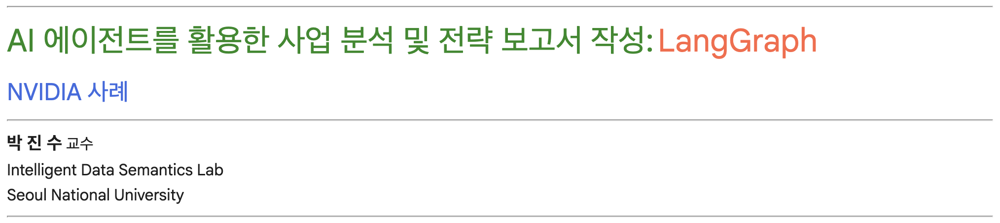

- - -

- 본 자료는 강의를 위한 목적으로 제작되었습니다.
- 본 자료에 대한 사전 허가를 받지 않는 배포를 금지합니다.
- 본 자료를 강의나 다른 목적으로 활용하고자 하시는 경우 꼭 아래 이메일 주소로 연락주세요.
- 연락처 : [jinsoo@snu.ac.kr](jinsoo@snu.ac.kr)

- - -

**<font size='+2'>목차**

>[0. Preparation](#scrollTo=D-ydfxr_SmNu)

>>[필요한 패키지 설치](#scrollTo=NWMOAzelS-Z4)

>>[Google Gemini API 설정](#scrollTo=QbstMfu0SvLH)

>>[OpenAI API 설정](#scrollTo=iNohJk6gS_WV)

>>[도우미 함수](#scrollTo=jln_UbuFTDXt)

>[1. 주제](#scrollTo=NHaXzT1bUEKK)

>[2. 업무 적용 시나리오](#scrollTo=74KR2F3tUbSG)

>[3. 에이전트 워크플로우 도식](#scrollTo=owEwUmLrucZe)

>[4. LangGraph 에이전트 구성](#scrollTo=_lzF1ZTwSUHO)

>>[4-1. 모델 및 파라미터 설정](#scrollTo=Vl3_9IDrTVuj)

>>[4-2. 데이터 스키마 정의](#scrollTo=qaEYdSI297yg)

>>[4-3. 그래프 상태 정의](#scrollTo=hUNhNDtlTb44)

>>[4-4. 프롬프트](#scrollTo=mUDm6A30etbL)

>>[4-5. 노드 정의](#scrollTo=hO-Usxd8WXez)

>>[4-6. 그래프 흐름 정의](#scrollTo=ZhvAAMFY9ADg)

>[5. 실행](#scrollTo=6i0vOAixvUqK)

>[[참고] 중간 단계 내용 확인](#scrollTo=iYaShUsLNmcD)

>>[10-K 문서 분석 노드](#scrollTo=1o28k8FESlMe)

>>[연례 보고서 분석 노드](#scrollTo=_t2Ed8lfSl-7)

>>[관련 뉴스 분석 노드](#scrollTo=Ybh4cOy8Sz6M)

>>[경쟁사 정보 수집 노드](#scrollTo=9_r6eRxoS0eY)



# **0. Preparation**

- - -
**<font size='+1'>⚙️ 실습 안내:** Google Gemini & OpenAI GPT</font>

본 실습에서는 **Google Gemini**와 **OpenAI GPT** 두 모델만 사용한다.   
이 두 모델은 **LangChain 환경에서의 도구(tool) 설정 및 통합이 상대적으로 간단**하며,  
웹 검색, 텍스트 생성, 이미지 생성 등 주요 기능을 손쉽게 구현할 수 있다.


> **💡 참고**  
> Anthropic Claude 등 다른 모델도 사용 가능하지만,  
> 본 실습의 목적은 핵심 개념 이해와 빠른 구현에 초점을 맞추었기 때문에  
> **Gemini**와 **GPT 모델**만을 대상으로 구성하였다.
- - -

## 필요한 패키지 설치

In [ ]:
!pip install -qU pypdf langgraph langchain-google-community 'langchain[google_genai]' 'langchain[openai]'  2> /dev/null

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.5/323.5 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.3/156.3 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.3/106.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 272.3/272.3 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.8/133.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 449.6/449.6 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7

## Google Gemini API 설정

**<font color='red' size='+1'>[주의] 아래 방법 중 <u>하나만 선택하</u>여 실행해야 합니다.</font>**

In [ ]:
# --- 방법 1
import os
from google.colab import userdata
os.environ['GOOGLE_API_KEY'] = userdata.get('GOOGLE_API_KEY')

In [ ]:
# --- 방법 2 - API Key를 입력한다.
import os, getpass
os.environ['GOOGLE_API_KEY'] = getpass.getpass('Enter Your Google API Key: ')

## OpenAI API 설정

**<font color='red' size='+1'>[주의] 아래 방법 중 <u>하나만 선택하</u>여 실행해야 합니다.</font>**

In [ ]:
# --- 방법 1
import os
from google.colab import userdata
os.environ['OPENAI_API_KEY'] = userdata.get('OPENAI_API_KEY')

In [ ]:
# --- 방법 2
import os, getpass
os.environ['OPENAI_API_KEY'] = getpass.getpass('Enter Your OpenAI API Key: ')

## 도우미 함수

In [ ]:
from langchain.chat_models import init_chat_model
from google.ai.generativelanguage_v1beta.types import Tool as GenAITool

def setup_model_and_tools(model: str = 'gemini') -> tuple[object, list]:
    """
    사용자가 'gpt' | 'gemini' 중 하나를 선택하면 해당 모델과 권장 도구를 반환한다.

    Args:
        model (str, optional): 사용할 모델 제공자 선택값 ('gpt' 또는 'gemini')
            기본값은 'gemini'이며 대소문자는 구분하지 않는다.
            - `'gpt'`: OpenAI GPT-5 모델과 내장 웹 검색 도구 사용
            - `'gemini'`: Google Gemini 모델과 Google Search 도구 사용

    Returns:
        tuple[object, list]:
            - model (object): 초기화한 언어 모델 인스턴스
            - tools (list): 해당 모델과 함께 사용할 권장 도구 리스트

    Raises:
        ValueError: 지원하지 않는 모델 제공자(`user_choice`)를 입력한 경우 발생
    """
    user_choice = model.lower().strip()

    # --- Google Gemini --------------------------------------------------------
    if user_choice == 'gemini':
        model = init_chat_model('google_genai:gemini-2.0-flash')
        # Google GenAI의 built-in 검색 도구
        tools = [GenAITool(google_search={})]
        return model, tools

    # --- OpenAI GPT -----------------------------------------------------------
    if user_choice == 'gpt':
        # model = init_chat_model('openai:gpt-5-mini')
        model = init_chat_model('openai:gpt-5')
        # OpenAI Responses API의 built-in 웹검색 툴
        tools = [{'type': 'web_search'}]
        return model, tools

    # --- 예외 처리 --------------------------------------------------------------
    raise ValueError(f'Unknown provider: {user_choice!r}')

In [ ]:
# --- 이미지 생성 도우미 함수
import base64
from google import genai
from google.genai import types
from openai import OpenAI
from typing import Literal

# Gemini 2.0 Flash Image Generation 모델 또는 GPT-IMAGE-1 모델을 활용해 이미지 생성 후 이미지 URL을 반환
def generate_image(prompt: str, model: Literal['gemini', 'gpt'] = 'gemini') -> str:
    """
    선택한 모델(Gemini 또는 GPT)을 사용하여 이미지를 생성하고 URL을 반환한다.

    Args:
        prompt (str): 이미지 생성을 위한 텍스트 프롬프트
        model (Literal['gemini', 'gpt']): 사용할 이미지 생성 모델 선택
            - 'gemini': Google Gemini 2.0 Flash Image 모델
            - 'gpt': OpenAI GPT 이미지 모델 (gpt-image-1)

    Returns:
        str: 생성한 이미지의 Base64 인코딩 데이터 URL (data:image/png;base64, ...)
    """

    if not prompt:
        raise ValueError('ERROR: prompt가 필요합니다. 이미지 생성을 위한 설명을 입력하세요.')

    user_choice = model.lower().strip()

    # --- Google Gemini --------------------------------------------------------
    if user_choice == 'gemini':
        client = genai.Client()
        model_name = 'gemini-2.0-flash-preview-image-generation'
        response = client.models.generate_content(
            model=model_name,
            contents=prompt,
            config=types.GenerateContentConfig(
                response_modalities=['TEXT', 'IMAGE']
            )
        )
        # 이미지 데이터 추출
        image_data = None
        for part in response.candidates[0].content.parts:
            if getattr(part, 'inline_data', None):
                image_data = part.inline_data.data
                break
        if image_data is None:
            raise ValueError('ERROR: Gemini 모델에서 이미지 데이터를 찾을 수 없습니다.')

        # base64 → data URL 변환
        img_b64 = base64.b64encode(image_data).decode('utf-8')
        image_url = f'data:image/png;base64,{img_b64}'
        return image_url

    # --- OpenAI GPT -----------------------------------------------------------
    elif user_choice == 'gpt':
        client = OpenAI()
        model_name = 'gpt-image-1'
        response = client.images.generate(model=model_name, prompt=prompt)
        b64_image = response.data[0].b64_json
        image_url = f'data:image/png;base64,{b64_image}'
        return image_url

    # --- 예외 처리 --------------------------------------------------------------
    else:
        raise ValueError(f'지원되지 않는 이미지 생성 모델 선택: {user_choice!r}')

In [ ]:
# --- PDF 파서: PDF 링크나 파일 경로를 입력 받아 PDF 파일의 텍스트 전체를 하나의 문자열로 반환
import requests, functools
from io import BytesIO
from pypdf import PdfReader

@functools.cache
def pdf_parser(path: str):
    pdf_file = None
    try:
        if path.startswith('http'):  # 입력 받은 경로가 URL인 경우 URL의 pdf 파일을 pdf_file에 저장
            response = requests.get(path, timeout=30)
            pdf_file = BytesIO(response.content)
        else:  # 입력 받은 path가 'http'로 시작하지 않으면 path를 로컬 파일로 가정하고 로컬 경로의 pdf 파일을 pdf_file에 저장
            with open(path, 'rb') as f:
                pdf_file = BytesIO(f.read())

        if not pdf_file:  # 잘못된 경로가 입력되어 pdf_file에 아무것도 없는 경우 오류 메시지 반환
            return 'PDF를 가져올 수 없습니다. 다시 시도해주세요'

        reader = PdfReader(pdf_file)
        all_text_content = []

        # 각 페이지의 텍스트를 all_text_content 리스트에 저장
        for page in reader.pages:
            page_text = page.extract_text()
            if page_text:
                all_text_content.append(page_text)

        # LLM에 전달할 수 있도록 하나의 문자열로 병합
        return '\n'.join(all_text_content).strip()
    except:
        return 'PDF 파일을 가져올 수 없습니다. 다시 시도해주세요'


# **1. 주제**

**주제**:
- NVIDIA의 2025 회계연도(Fiscal Year 2025) 수익 견인 요인과 향후 전략 분석에 관한 보고서 작성
- **참고**: NVIDIA의 2025 회계연도는 2024년 1월 29일부터 2025년 1월 26일이다.

**주제 선정 사유**:
- 에이전트와 툴을 활용하여 복잡한 분석 작업을 자동화함으로써 분석 속도와 정확도를 높인다.

- 생성형 AI를 통해 기업의 공식 보고서와 외부 데이터를 종합적으로 분석하고, 인사이트 중심의 보고서를 작성한다.

- 방대한 정보를 선별하고 요약하는 과정을 통해 핵심 수익 요인을 파악한다.

- 분석 결과를 실제 업무에 활용 가능한 형태로 재구성함으로써 보고서 작성 역량을 강화한다.

- 데이터 기반 경영 분석 업무에 생성형 AI를 실질적으로 적용하는 방법을 탐색한다.

# **2. 업무 적용 시나리오**

- 기획전략실에서 연간 사업계획 수립, 투자자 대상 발표 자료 작성, 경쟁사 벤치마킹 리포트 작성 등의 업무를 수행할 때, 기업의 재무보고서와 시장 뉴스를 빠르게 분석해 수익 구조와 성장 요인을 정리해야 하는 상황이 발생한다.

- 이러한 상황에서 생성형 AI 기반 에이전트를 활용하면, 10-K 보고서, 연례 보고서, 관련 뉴스 기사 등 방대한 자료를 자동으로 파싱하고 요약할 수 있으며, 이를 기반으로 핵심 매출 견인 요인을 도출하고 보고서 형식으로 정리할 수 있다.

- 사업 부문별 매출 흐름과 외부 환경 요인을 연결하여 설명하는 방식은 실제 전략 보고서 작성이나 IR 자료 구성 시 바로 적용 가능하다.

- 반복적인 분석과 요약 작업을 자동화함으로써 실무자의 분석 시간을 단축시키고, 보다 전략적인 해석과 의사결정에 집중할 수 있도록 지원하는 실질적 도구로 활용될 수 있다.

# **3. 에이전트 워크플로우 도식**

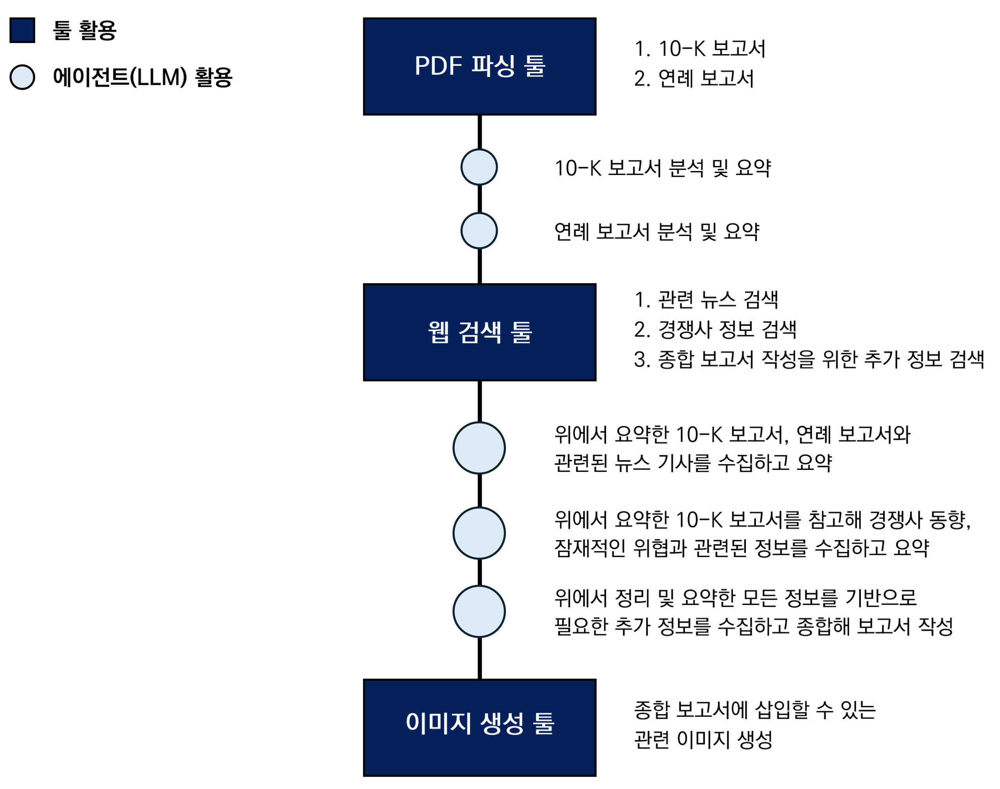

# **4. LangGraph 에이전트 구성**

## **4-1. 모델 및 파라미터 설정**

In [ ]:
# --- 모델 및 파라미터 설정

# model = 'gemini' (default) | 'gpt'
# MODEL, TOOLS = setup_model_and_tools(model='gemini')
MODEL, TOOLS = setup_model_and_tools(model='gpt')

In [ ]:
# --- 이미지 생성 모델 설정

# 아래 둘 중 하나를 선택한다. (참고: Anthropic은 현재 이미지 생성 모델을 제공하지 않는다)
# IMAGE_MODEL = 'gemini'
IMAGE_MODEL = 'gpt'

## **4-2. 데이터 스키마 정의**

In [ ]:
# [관련 이미지 생성 노드]에서 LLM이 구조화한 출력을 수행할 수 있도록 데이터 스키마를 미리 정의한다.
from pydantic import BaseModel, Field

class ImagePrompt(BaseModel):
    """
    이미지 생성 프롬프트를 저장하는 데이터 스키마
    """
    description: str = Field(
        ...,
        description='이미지 프롬프트에 대한 간단한 한글 설명'
    )
    prompt: str = Field(
        ...,
        description='이미지 생성용 영어 프롬프트'
    )

## **4-3. 그래프 상태 정의**

In [ ]:
from operator import add
from typing import TypedDict, Annotated
# from typing import Annotated
from langgraph.graph import MessagesState


class InputState(TypedDict):
    """
    그래프 실행에 필요한 입력 데이터를 정의하는 상태 스키마

    Attributes:
        ten_k_report (str): 10-K 보고서 원문 데이터를 저장한다.
        annual_report (str): 연례(Annual) 보고서 원문 데이터를 저장한다.
    """
    ten_k_report: str
    annual_report: str

class State(TypedDict):
    """
    그래프 상태를 나타내는 클래스

    그래프의 각 노드에서 처리할 입력 데이터와 관련된 상태를 관리한다.

    Attributes:
        summary_10k (Annotated[list[str], add]):
            10-K 보고서의 분석/요약 결과를 저장한다.
        summary_annual (Annotated[list[str], add]):
            연례 보고서의 분석/요약 결과를 저장한다.
        news (str): 관련 뉴스 기사를 분석/요약한 결과를 저장한다.
        competitors (str): 경쟁사 정보를 분석/요약한 결과를 저장한다.
        final_report (str): 최종적으로 작성한 종합 보고서를 저장한다.
        image_prompt (str):
            보고서와 관련된 이미지를 생성하기 위한 프롬프트를 저장한다.
        image_url (str):
            보고서와 관련된 이미지를 생성한 후, 생성한 이미지의 URL을 저장한다.
    """
    summary_10k: Annotated[list[str], add]
    summary_annual: Annotated[list[str], add]
    news: str
    competitors: str
    final_report: str
    image_prompt: str
    image_url: str

## **4-4. 프롬프트**

In [ ]:
SYSTEM_INSTRUCTION = '''당신은 응답을 생성할 때 반드시 \
다음 지시사항을 **엄격히 준수해야 합니다.**

<응답 방식>
답변 시작 전에 설명하거나 계획을 말하지 말고, 바로 보고서 본문부터 \
작성하십시오. '알겠습니다', '조사하겠습니다' 등과 같은 문장은 \
포함하지 마십시오.
</응답 방식>

<출력 형식>
출력은 항상 마크다운 형식으로 해주세요. 제목, 목록, 표, \
코드 블록 등 구조를 명확히 표현하고, 단순 텍스트라도 \
항상 마크다운 규칙을 적용해 주세요.
</출력 형식>
'''

TEN_K_INSTRUCTION = '''당신은 10-K 리포트를 읽고 분석하여 \
상세한 결과물을 제공하는 뛰어난 분석가입니다. 아래 주어지는 \
NVIDIA의 10-K 리포트를 읽고 2024 회계연도에서 2025 회계연도의 \
매출 추이와 매출 견인 요인들을 최대한 상세히 분석해주세요. \
분석 결과 보고서는 한국어로 작성합니다.

10-K REPORT: {report_10k}
'''

ANNUAL_REPORT_INSTRUCTION = '''당신은 연례 보고서를 읽고 \
분석하는 경험이 풍부한 전문가입니다. 아래 주어지는 NVIDIA의 \
연례 보고서를 읽고 2024 회계연도에서 2025 회계연도의 매출 추이와 \
매출 견인 요인들을 최대한 상세히 분석해주세요. \
분석 결과 보고서는 한국어로 작성합니다.

ANUUAL REPORT FOR SECURITIES HOLDERS: {annual_report}
'''

NEWS_ANALYSIS_INSTRUCTION = '''당신은 분석 자료를 토대로 \
관련 뉴스 기사를 수집하는 경험이 풍부한 시니어 조사 연구원입니다. \
주어진 분석 자료에서 주요 주제들을 찾아, 각 주제별로 뉴스 기사를 \
최소 3개 이상을 웹 검색으로 수집해야 합니다. 또한, 당신은 각 \
뉴스들을 보고서에 삽입할 수 있도록 뉴스별로 최소 1문단(6문장 이상) \
이상으로 자세하고 사업적인 관점에서 요약합니다. 또한, 웹에서 참고한 \
각 기사마다 **반드시** URL을 명확히 남겨야 합니다.

IMPORTANT: 당신의 답변은 주어진 보고서나 웹 검색 결과만을 \
기반으로 작성하세요. 당신이 알고 있는 지식이나 가정에 의존하여 \
답해서는 안 됩니다. 절대로 답을 지어내려고 하지 마세요.

아래 두 개의 보고서를 읽고 관련 뉴스 기사를 수집한 후, 각 뉴스별로 \
요약해주세요.

<10-K 분석 요약 보고서>
{summary_10k}
</10-K 분석 요약 보고서>

<연례 보고서 분석 요약 보고서>
{summary_annual}
</연례 보고서 분석 요약 보고서>
'''

COMPETITOR_ANALYSIS_INSTRUCTION = '''당신은 NVIDIA \
전략기획부서의 전략기획 지원 담당자입니다. 당신의 주요 업무는 \
경쟁사의 **현황**과 이와 관련된 **잠재적인 위협**을 인터넷에서 \
조사해야 합니다. 조사한 자료들의 URL도 함께 남겨주세요.

IMPORTANT: 당신의 답변은 주어진 보고서나 웹 검색 결과만을 \
기반으로 작성하세요.당신이 알고 있는 지식이나 가정에 의존하여 \
답해서는 안 됩니다. 절대로 답을 지어내려고 하지 마세요.

아래 보고서를 읽고 NVIDIA에 위협이 될만한 것들을 위주로 \
조사해서 보고서를 자세히 작성해주세요.

<10-K 분석 요약 보고서>
{summary_10k}
</10-K 분석 요약 보고서>
'''

FINAL_REPORT_INSTRUCTION = '''당신은 NVIDIA \
전략기획부서의 시니어 매니저입니다. 당신의 주 임무는 주어진 \
보고서와 요약문들을 토대로 새로운 사업 분석 및 전략 보고서를 \
만드는 것입니다. 필요하다면 웹 검색을 통해 자료를 보강해주세요. \

IMPORTANT: 당신의 답변은 주어진 보고서나 웹 검색 결과만을 \
기반으로 작성하세요.당신이 알고 있는 지식이나 가정에 의존하여 \
답해서는 안 됩니다. 절대로 답을 지어내려고 하지 마세요.


아래 주어지는 보고서들과 뉴스들을 종합해서 최소 1500 단어 이상 \
분량의 보고서를 작성하세요.

<10-K 분석 요약 보고서>
{summary_10k}
</10-K 분석 요약 보고서>

<연례 보고서 분석 요약 보고서>
{summary_annual}
</연례 보고서 분석 요약 보고서>

<뉴스 기사 분석 요약 보고서>
{news}
</뉴스 기사 분석 요약 보고서>

<경쟁사 분석 요약 보고서>
{competitors}
</경쟁사 분석 요약 보고서>
'''


IMAGE_PROMPT_INSTRUCTION = '''당신은 이미지 생성을 \
잘 할 수 있도록 도와주는 이미지 생성 프롬프트 작가입니다.

아래 보고서를 검토한 후 해당 보고서의 내용을 이미지로 가장 잘 \
표현할 수 있는 영어 프롬프트를 1개 제안해 주세요.

<보고서>
{final_report}
</보고서>
'''


## **4-5. 노드 정의**

In [ ]:
from langgraph.types import Command
from langgraph.graph import END
from langchain_core.messages import SystemMessage, HumanMessage
from langchain.tools import Tool

# --- NVIDIA 10-K 분석 노드 정의
def summary_10k_node(state: InputState) -> State:
    """
    NVIDIA 10-K 분석을 수행하는 노드
    """
    print('> Processing... ||10k Summarizer Node||\n')
    summary_10k = MODEL.invoke([HumanMessage(
        content=TEN_K_INSTRUCTION.format(
            report_10k=state['ten_k_report']
    ))])
    # 기존 상태에 10K 분석 데이터를 추가하고 반환한다.
    return {'summary_10k': [summary_10k.content]}  # NOTE: return list for 병렬 처리


# --- NVIDIA 연례 보고서 분석 노드 정의
def summary_annual_node(state: InputState) -> State:
    """
    NVIDIA 연례 보고서 분석을 수행하는 노드
    """
    print('> Processing... ||Annual Report Summarizer Node||\n')
    summary_annual = MODEL.invoke([HumanMessage(
        content=ANNUAL_REPORT_INSTRUCTION.format(
            annual_report=state['annual_report']
    ))])
    # 기존 상태에 연례 보고서 분석 데이터를 추가하고 반환한다.
    return {'summary_annual': [summary_annual.content]}  # NOTE: return list for 병렬 처리


# --- NVIDIA 관련 뉴스 분석 노드 정의
def news_analysis_node(state: State) -> State:
    """
    NVIDIA 관련 뉴스 분석을 수행하는 노드
    """
    print('> Processing... ||News Analyzer Node||\n')
    news = MODEL.invoke([HumanMessage(
        content=NEWS_ANALYSIS_INSTRUCTION.format(
            summary_10k=state['summary_10k'],
            summary_annual=state['summary_annual']
        ))],
        tools=TOOLS
    )
    # 기존 상태에 관련 뉴스 분석 데이터를 추가하고 반환한다.
    return state | {'news': news.content}


# --- NVIDIA 경쟁사 정보 수집 노드 정의
def competitor_analysis_node(state: State) -> State:
    """
    NVIDIA 경쟁사 정보 수집을 수행하는 노드
    """
    print('> Processing... ||Competitors Analyzer Node||\n')
    competitors = MODEL.invoke([HumanMessage(
        content=COMPETITOR_ANALYSIS_INSTRUCTION.format(
            summary_10k=state['summary_10k']
        ))],
        tools=TOOLS
    )
    # 기존 상태에 경쟁사 정보 수집 데이터를 추가하고 반환한다.
    return state | {'competitors': competitors.content}

# --- 종합 보고서 작성 노드 정의
def report_writing_node(state: State) -> State:
    """
    종합 보고서 작성을 수행하는 노드
    """
    print('> Processing... ||Final Report Writer Node||\n')
    final_report = MODEL.invoke(
        [SystemMessage(content=SYSTEM_INSTRUCTION)]
        + [HumanMessage(content=FINAL_REPORT_INSTRUCTION.format(
            summary_10k=state['summary_10k'],
            summary_annual=state['summary_annual'],
            news=state['news'],
            competitors=state['competitors']
        ))],
        tools=TOOLS
    )
    # 기존 상태에 종합 보고서 데이터를 추가하고 반환한다.
    return state | {'final_report': final_report.content}

# --- 관련 이미지 생성 노드 정의
def image_generating_node(state: State) -> State:
    """
    관련 이미지 생성을 수행하는 노드
    """
    print('> Processing... ||Report Cover Image Generator Node||')
    # 이미지 프롬프트를 출력할 때 ImagePrompt 데이터 스키마에 맞게 구조화되어 출력하기 위해 with_structured_output을 사용한다.
    image_prompt = MODEL.with_structured_output(ImagePrompt).invoke([
        IMAGE_PROMPT_INSTRUCTION.format(final_report=state['final_report'])
    ])
    # 도우미 함수 generate_image() 를 이용해서 이미지를 생성한다.
    # 선택지로 'gemini'와 'gpt' 중에서 선택할 수 있다.
    image_url = generate_image(image_prompt.prompt, model=IMAGE_MODEL)

    # 기존 상태에 이미지 URL 데이터를 추가하고 반환한다.
    return state | {
        'image_prompt': image_prompt.prompt,
        'image_url': image_url
        }

## **4-6. 그래프 흐름 정의**

In [ ]:
from langgraph.graph import StateGraph, START, END

graph = StateGraph(State, input_schema=InputState)

# --- node
graph.add_node(node='10K Summarizer', action=summary_10k_node)
graph.add_node('Annual Report Summarizer', summary_annual_node)
graph.add_node('News Analyzer', news_analysis_node)
graph.add_node('Competitor Analyzer', competitor_analysis_node)
graph.add_node('Final Report Writer', report_writing_node)
graph.add_node('Report Cover Image Generator', image_generating_node)


# --- edge
graph.add_edge(start_key=START, end_key='10K Summarizer')
graph.add_edge(START, 'Annual Report Summarizer')
graph.add_edge('10K Summarizer', 'News Analyzer')
graph.add_edge('Annual Report Summarizer', 'News Analyzer')
graph.add_edge('10K Summarizer', 'Competitor Analyzer')
graph.add_edge('News Analyzer', 'Final Report Writer')
graph.add_edge('Competitor Analyzer', 'Final Report Writer')
graph.add_edge('Final Report Writer', 'Report Cover Image Generator')
graph.add_edge('Report Cover Image Generator', END)

# --- compile
workflow = graph.compile()

In [ ]:
from IPython.display import Image, display
import base64

mermaid = workflow.get_graph().draw_mermaid() # Workflow에서 Mermaid 다이어그램 소스(텍스트)를 문자열로 추출
b64 = base64.b64encode(mermaid.encode('utf-8')).decode('ascii')
url = f'https://mermaid.ink/img/{b64}' # 브라우저가 mermaid.ink에 이미지 생성을 요청
display(Image(url=url))

# **5. 실행**

NVIDIA 2025 회계연도 10-K 보고서
- https://s201.q4cdn.com/141608511/files/doc_financials/2025/q4/177440d5-3b32-4185-8cc8-95500a9dc783.pdf
- 참고: NVIDIA의 2025 회계연도는 2024년 1월 29일부터 2025년 1월 26일이다.

In [ ]:
# --- PDF 파일을 가져와 일반 텍스트 파일로 바꾼다.
# (caution) 문서가 매우 크면 인덱싱을 해야 한다.
# 이 실습은 개념 전달이 목적이기 때문에 문서분할-임베딩-벡터스토어 인덱싱 과정을 생략한다.
# 참고: RAG(Retrieval Augmented Generation)
report_10k = pdf_parser('https://s201.q4cdn.com/141608511/files/doc_financials/2025/q4/177440d5-3b32-4185-8cc8-95500a9dc783.pdf')
print(report_10k)

Table of Contents
UNITED STATESSECURITIES AND EXCHANGE COMMISSION
Washington, D.C. 20549
____________________________________________________________________________________________
FORM 10-K
☒ ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES EXCHANGE ACT OF 1934
    For the fiscal year ended January 26, 2025
OR
☐ TRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE SECURITIES EXCHANGE ACT OF 1934
Commission file number: 0-23985
 
  
NVIDIA CORPORATION
(Exact name of registrant as specified in its charter)
Delaware 94-3177549
(State or other jurisdiction of (I.R.S. Employer
incorporation or organization) Identification No.)
   2788 San Tomas Expressway, Santa Clara, California 95051
  (Address of principal executive offices) (Zip Code)
Registrant’s telephone number, including area code: (408) 486-2000
Securities registered pursuant to Section 12(b) of the Act:
Title of each class Trading Symbol(s) Name of each exchange on which registered
Common Stock, $0.001 par val

NVIDIA 2025 회계연도 연례 보고서 분석
- https://d18rn0p25nwr6d.cloudfront.net/CIK-0001045810/80be65cd-c965-4af3-b42f-ec3c0d75f16f.pdf
- **참고**: NVIDIA의 2025 회계연도는 2024년 1월 29일부터 2025년 1월 26일이다.

In [ ]:
# --- NVIDIA의 2025년도 회계연도 연례 보고서 PDF 파일을 가져와 일반 텍스트 파일로 바꾼다.
# (caution) 문서가 매우 크면 인덱싱을 해야 한다.
# 이 실습은 개념 전달이 목적이기 때문에 문서분할-임베딩-벡터스토어 인덱싱 과정을 생략한다.
# 참고: RAG(Retrieval Augmented Generation)

annual_report = pdf_parser('https://d18rn0p25nwr6d.cloudfront.net/CIK-0001045810/80be65cd-c965-4af3-b42f-ec3c0d75f16f.pdf')
print(annual_report)

2025
NVIDIA Corporation
Annual Review
Notice of Annual Meeting 
Proxy Statement 
Form 10-K
The Future Runs on 
Accelerated Computing
 We’re entering a new industrial revolution. This time, intelligence is the product. 
Generative and agentic AI generate, reason, and act. Like electricity, intelligence is 
becoming a ubiquitous utility. Nations are building AI infrastructure, and NVIDIA powers 
this transformation. We’re not just advancing AI. We’re building the infrastructure 
of intelligence, turning computing into a generative force for every industry.
Photograph by: Katie Thompson
The Intelligence Supply 
Chain Has Arrived

AI factories are a new class of infrastructure,  transforming data into tokens of 
intelligence. Built on the NVIDIA full-stack platform with NVIDIA Blackwell GPUs and 
NVLink, they deliver unmatched performance and efficiency, powering trillion-dollar 
industries. Intelligence is no longer stored and retrieved. It’s continuously generated by 
AI factories. NVIDI

In [ ]:
# [NOTE] 이 단계는 모델이 전체 보고서를 분석하므로 처리에 수 분이 소요될 수 있다.
#        모델 종류와 시스템 환경에 따라 더 오래 걸릴 수도 있다.
result = workflow.invoke({
    'ten_k_report': report_10k,
    'annual_report': annual_report
})

> Processing... ||10k Summarizer Node||

> Processing... ||Annual Report Summarizer Node||

> Processing... ||Competitors Analyzer Node||
> Processing... ||News Analyzer Node||


> Processing... ||Final Report Writer Node||

> Processing... ||Report Cover Image Generator Node||


In [ ]:
from IPython.display import Markdown

final_report =  result['final_report'] if isinstance(result['final_report'], str) else result['final_report'][0]['text']
Markdown(final_report)

# FY2025 성과 진단과 FY2026 전략 제언: 데이터센터 풀스택 가속, 네트워킹 스케일-어크로스, 규제/공급망 복합 리스크 대응

## 1) Executive Summary

- FY2025 전사 매출은 1,305억 달러(+114% YoY), 총이익률 75.0%(+2.3%p), 영업이익 815억 달러(+147%)로 구조적 체질 개선을 입증했다. 매출 증가분의 ~97%가 데이터센터에서 발생했으며, 그 중 Compute가 증가분의 ~91%를 차지했다. 데이터센터 네트워킹 매출도 +51%로 2차 성장축 역할을 수행했다. [제공 10‑K/연례 분석 요약]

- 분기 흐름상 FY2025 4분기 매출 393억 달러(+78% YoY), 데이터센터 356억 달러(+93% YoY)로 고점 갱신. 경영진은 Blackwell AI 슈퍼컴퓨터가 첫 분기부터 “수십억 달러” 매출을 창출했다고 밝혔다. FY2026 가이던스(1Q)도 강세로, Blackwell의 연간 반영이 본격화되는 해다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-fourth-quarter-and-fiscal-2025?utm_source=openai))

- 네트워킹은 InfiniBand에 더해 Ethernet for AI(Spectrum‑X) 채택이 가속. 2025년 3월 광집적(Co‑packaged Optics) 스위치 발표, 8월에는 분산 데이터센터를 단일 AI 팩토리로 묶는 Spectrum‑XGS(Scale‑Across) 공개로 ‘스케일‑업/아웃’을 넘어 ‘스케일‑어크로스’까지 확장하는 로드맵을 제시. 엔터프라이즈 채택 가속을 위해 Cisco와의 Spectrum‑X 통합 파트너십도 발표됐다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-supercharges-ethernet-networking-for-generative-ai?utm_source=openai))

- 규제 변수는 2025‑01‑15 BIS의 ‘AI Diffusion’ 임시최종규정(IFR) 고시로 전세계 라이선스 요건과 모델 웨이트 통제가 도입되었다가 2025‑05‑12 사실상 철회(Rescission) 공지로 급변. 중국향 H20 판매는 7월 15일 라이선스 기반 재개 시그널이 확인됐다. 지역/고객·SKU 전략의 동적 재설계가 필수다. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

- 고객·생태계: CoreWeave가 2025‑07‑03 업계 최초로 GB300 NVL72(Blackwell Ultra 세대)를 상용 배치하며 추론/리저닝 워크로드의 성능·전력 효율 개선을 실증했다. Oracle‑NVIDIA 협업으로 OCI 콘솔에서 AI Enterprise·NIM이 네이티브 제공, 소프트웨어/서비스 동반 성장이 가속화된다. ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))

- 경쟁 구도: AMD의 MI350(2025)/MI400(2026) 로드맵과 ROCm 성숙, Intel Gaudi 3 상용화, 클라우드 자체 실리콘(AWS Trainium2, Google TPU Trillium/7세대 Ironwood) 확대로 이원화/대체 경로가 확대. 이더넷 진영은 UEC 1.0 공개, Broadcom Tomahawk 6 출하로 개방형 이더넷 기반 AI 패브릭이 고도화되는 중. ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))

- 결론: FY2026의 핵심은 “풀스택+풀시스템+풀에코시스템”의 확산을 Blackwell/Blackwell Ultra의 연간 효과와 Ethernet for AI 확장(Spectrum‑X/Spectrum‑XGS, 포토닉스)로 결박하는 것. 동시적으로 IFR 변동성, 중국 매출 경로, HBM4 조달 경쟁, 경쟁사의 표준화 공세(UEC/UALink)에 대한 기민한 대응이 성장의 방파제가 된다. [제공 10‑K/연례/경쟁사 분석 요약]

---

## 2) FY2025 실적 리캡과 질적 성과

- 전사: 매출 1,305억 달러(+114%), 총이익률 75.0%(+2.3%p), 영업이익 815억 달러(+147%), 순이익 728억 달러(+145%). 데이터센터 1,152억 달러(+142%) 중 Compute 1,022억(+162%), Networking 130억(+51%). 세그먼트 기준 Compute & Networking 1,162억(+145%). [제공 10‑K/연례 분석 요약]

- 4분기 하이라이트: 분기 매출 393억, 데이터센터 356억, Blackwell 첫 분기 수십억 달러 매출. 총이익률은 제품 전환·재고 관련 변동성을 받았으나 믹스 개선으로 연간 확대. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-fourth-quarter-and-fiscal-2025?utm_source=openai))

- 현금/운영: 영업현금흐름 641억 달러, 재고 101억(전년 53억)로 신제품 전환·동시 운영(Hopper/Blackwell)의 부산물. 재고충당·약정비용이 연중 총마진에 –2.3%p 역풍. 선급/용량 커밋 308억 달러, 총 구매의무 451억 달러. [제공 10‑K/연례 분석 요약]

- 지역/고객: 미국 612억, 싱가포르 236억(인보이싱 허브), 대만 206억, 중국(홍콩 포함) 171억. 직판 상위 3개 고객이 각각 12%/11%/11%. [제공 10‑K/연례 분석 요약]

---

## 3) 수요 엔진: 훈련에서 ‘추론(Reasoning)/에이전틱’ 중심으로

- 대형 LLM·추천·멀티모달 기반의 ‘추론’ 비중 확대. 테스트‑타임 스케일링, 긴 문맥, 도구사용, 에이전트형 AI가 실제 서비스 단계로 진입하면서, 실시간 지연·처리량·TCO를 동시에 최적화하는 연산/메모리/네트워킹 수요가 구조적으로 증폭. [제공 연례 분석 요약]

- 제품/로드맵 접점: Blackwell의 연간 램프와 Blackwell Ultra(GB300) 가시화, 4Q만 110억 달러 전환 속도를 보여 향후 FY2026 파이프라인의 견조함을 시사. GTC 2025에서 Blackwell Ultra·차세대(Rubin)·소프트웨어(Dynamo 등)가 동시 제시되어 풀스택 일관성을 강화. ([reuters.com](https://www.reuters.com/technology/everything-nvidia-announced-its-annual-developer-conference-gtc-2025-03-18/?utm_source=openai))

- 고객 사례: CoreWeave의 GB300 NVL72 첫 상용 배치(2025‑07‑03)는 사용자 응답성 최대 10배, 전력 대비 처리량 5배, 추론 출력 50배 개선(자사 수치) 등을 제시하며 리저닝/에이전틱 워크로드 상용화의 촉매로 작용. ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))

---

## 4) 네트워킹 전환: Ethernet for AI와 ‘Scale‑Across’의 도래

- 채택 가속: Spectrum‑X는 2024‑06 발표 당시 CoreWeave, Lambda, Scaleway 등 GPU 클라우드와 Dell/HPE/Lenovo 등 주요 시스템 메이커 채택이 확인. 엔터프라이즈/멀티테넌트 환경에서도 대규모 AI 클러스터를 지탱하는 축으로 부상. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-supercharges-ethernet-networking-for-generative-ai?utm_source=openai))

- 파트너십: 2025‑02‑25 Cisco와의 확장 협력으로 Cisco Silicon One + NVIDIA SuperNIC이 Spectrum‑X 플랫폼에 통합되는 계획 발표. 엔터프라이즈 데이터센터에서 프런트엔드~백엔드 네트워크를 아우르는 통합 아키텍처 제공으로 배치/운영 단순화·성능/가시성 향상 기대. ([newsroom.cisco.com](https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934&utm_source=openai))

- 포토닉스 로드맵: 2025‑03‑18 포토닉스 기반 스위치 공개—포트당 1.6Tbps, 3.5배 전력 효율, 63배 신호무결성, 10배 네트워크 회복력 개선(자사 수치), TSMC 등과 공급망 연계. 대규모 AI 팩토리를 ‘수백만 GPU’ 스케일로 확장하기 위한 핵심 인프라. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))

- Scale‑Across: 2025‑08‑22 Spectrum‑XGS 발표—분산 데이터센터를 하나의 ‘기가스케일 AI 슈퍼팩토리’로 연결. 거리 기반 혼잡 제어·정밀 지연 관리·E2E 텔레메트리로 사이트 간 예측 가능 성능 제공. CoreWeave 초기 도입. 전력/입지 제약을 회피하는 멀티리전 설계와 자원 활용률 극대화에 직접 기여. ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))

- 시사점: FY2026에는 NVLink 스케일‑업 + InfiniBand/Ethernet 스케일‑아웃 + Spectrum‑XGS 스케일‑어크로스의 삼각편대로, ‘데이터센터가 연산 단위’인 시대에 배치/운영의 효율성을 TCO로 환산해 제시하는 것이 관건.

---

## 5) 규제·지역 리스크 업데이트와 중국 매출 경로

- AI Diffusion IFR(2025‑01‑15): ECCN 3A090.a/4A090.a 등급 전세계 라이선스 요건 및 특정 ‘폐쇄형’ 모델 웨이트(4E091) 통제 포함, UVEU/NVEU 검증체계, 일부 조항 2026‑01‑15 지연 시행. 업계의 전환 기간(다수 조항 2025‑05‑15 준수시점) 부여. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

- 2025‑05‑12 철회 공지: BIS가 IFR을 공식 철회하고 가이던스 중심으로 전환. 정책 변동성이 크므로 SKU·주문·사후검증·라이선스 프로세스를 ‘시나리오 기반’으로 운영할 필요. ([bis.doc.gov](https://www.bis.doc.gov/index.php/documents/federal-register-notices-1/3563-90-fr-4544-framework-for-artificial-intelligence-diffusion-ifr-0694-aj90-1-15-2025?format=html&utm_source=openai))

- 중국 재개 시그널: 2025‑07‑15 H20의 중국 판매 재개를 위한 라이선스 승인 보장(회사 입장) 보도. 라이선스 기반 모델은 리드타임·채권/재고 관리 복잡도를 높이나, 전용 SKU 경로의 가시성을 회복한다. ([cnbc.com](https://www.cnbc.com/2025/07/15/nvidia-says-us-government-will-allow-it-to-resume-h20-ai-chip-sales-to-china.html?utm_source=openai))

- 전략 과제: (1) 지역별 규제 시나리오(강화/현상/완화)별 SKU·가격·채널 매트릭스, (2) 주문–라이선스–출하–사후검증 E2E 리드타임 모니터링, (3) 중국 외 ‘소버린 AI’ 수요로 포트폴리오 비중 헤지, (4) 서비스/소프트웨어(지원 제외 정책 포함) 수익성 방어.

---

## 6) 비데이터센터 포트폴리오의 후방 견인

- RTX 50(Blackwell) 런칭: 2025‑01‑06 공개—DLSS 4, Reflex 2(Frame Warp), RTX Neural Shaders, Neural Faces 등 AI 네이티브 그래픽스. 데스크톱 상위 SKU(5090/5080)는 1월 30일 출시, 5070Ti/5070은 2월, 노트북은 3~4월 가용. 프리미엄 포지셔닝으로 하이엔드/크리에이티브 수요 자극. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-blackwell-geforce-rtx-50-series-opens-new-world-of-ai-computer-graphics?utm_source=openai))

- 클라우드 게이밍: GeForce NOW의 RTX 5080 업그레이드(2025‑09‑10)로 5K/120fps, 1440p/240fps, 1080p/360fps, DLSS 4/뉴럴 렌더링 지원—하드웨어/클라우드의 상보적 저변 확대와 서비스 매출 비중 제고에 기여. ([theverge.com](https://www.theverge.com/news/771273/nvidia-geforce-now-rtx-5080-upgrade-release-date?utm_source=openai))

- 소프트웨어/서비스: Oracle‑NVIDIA 협업(2025‑03‑18)으로 OCI 콘솔에서 AI Enterprise(160+ 툴)/NIM(100+ 마이크로서비스) 네이티브 제공—엔터프라이즈 추론/에이전틱 AI 배포를 가속. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))

---

## 7) 경쟁 지형: ‘개방형 이더넷 + 대안 가속기’의 공세와 대응축

- 가속기: AMD MI350(2025), MI400(2026 예정) 연간 주기 가속과 ROCm 성숙, MLPerf 제출 확대. Intel Gaudi 3는 클라우드/엔터프라이즈 채택을 늘리며 ‘가격/성능+이더넷’ 조합을 강화. 클라우드는 AWS Trainium2 GA(2024‑12), Google Trillium GA(2024‑12) 및 7세대 TPU Ironwood(2025‑04, 추론 특화)로 자사 실리콘을 확장. ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))

- 네트워킹 표준화: UEC 1.0(2025‑06‑11) 공개로 다벤더 상호운용·탈락인 메시지 강화. Broadcom Tomahawk 6(102.4Tbps) 출하는 개방형 이더넷 기반 AI 패브릭의 성숙을 입증. Arista Etherlink는 800G 단일 스택·관측성 강화로 대규모 AI 도메인 공략. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))

- 함의: (1) 대형 CSP/엔터프라이즈 RFP에서 “NVIDIA 단일 번들” 대비 “NVIDIA+타사 네트워킹/가속기” 조합의 협상력이 상승, (2) 개방 표준이 성숙될수록 우리 NVLink/NVSwitch·InfiniBand·Spectrum‑X의 차별성 메시지를 ‘성능/지연/운영의 예측가능성+TCO’로 재정의해야 함.

---

## 8) 공급망: HBM4 경쟁과 패키징/냉각 캐파

- HBM4: SK hynix는 2025‑09 내부 인증 완료·양산 준비, 12‑Hi 설계·전력 효율 개선, 고객별 커스텀 로직 다이로 전환 시 대체 난이도 상승. Micron은 2.8TB/s 대역폭 샘플 출하를 알리며 추격. 차세대 HBM 수급 협상력·납기·사양이 FY2026 성과의 민감도로 부상. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

- 시사점: (1) HBM4 멀티벤더 전략(사전 합의·공정/적층 사양별 다원화), (2) CoWoS·액침/직접냉각 파트너 조기 캐파 선점, (3) ‘플랫폼별 HBM 사양’과 총전력/밀도 설계의 연동으로 TCO 최소화.

---

## 9) FY2026 시나리오(정량 가이던스 아님, 실행·리스크 관점)

- Base: Blackwell/Blackwell Ultra의 연간 반영 + Ethernet for AI 확산 + XGS 초기 매출 기여. 소프트웨어/서비스(Enterprise/NIM/DGX Cloud) 동반 성장. IFR 집행은 가이던스 체계 유지, 중국향 라이선스 기반 출하 점진 회복. [제공 연례/뉴스 요약, IFR/중국 라이선스 기사 근거] ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

- Upside: 포토닉스 스위치 조기 대량 도입, 대형 ‘소버린 AI’ 수주, 엔터프라이즈 Ethernet 표준화 확산(UEC 호환성 요구와 병행). CoreWeave·네오클라우드의 대규모 선주문이 장기 커밋과 맞물려 가시성 개선. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))

- Downside: HBM4/패키징 병목 심화, 규제 재강화(라이선스 축소), 개방형 표준(UEC/UALink) 급진전으로 네트워킹/스케일‑업 링크에서 번들 경쟁력 약화, 주요 CSP의 자체 실리콘 증설 가속. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))

---

## 10) 전략 제언: 6대 축 실행안

### A. AI 팩토리 풀스택 고도화: ‘성능–지연–예측가능성–TCO’를 수치화
- 제품: GB200/GB300 NVL72의 추론 지연/처리량/전력효율 벤치마크(고객 워크로드 기반) 공개 확대. CoreWeave 사례를 템플릿화해 업종별(검색·광고·커머스·에이전틱 콜센터 등) KPI와 연결. ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))
- 시스템: NVLink 스위치·NVSwitch와 Spectrum‑X/InfiniBand·포토닉스 조합의 ‘최적 설계 영역(스윗스팟)’ 가이드를 퍼블릭화—스케일‑업 vs 스케일‑아웃/어크로스의 경제성 모델 포함. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))
- 소프트웨어: NIM·AI Enterprise·Blueprints를 클라우드(OCI 등)·온프렘 병행으로 “주간→수시간” 배포 SLA 제시(레퍼런스 가격/성능·운영 인력 절감). ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))

### B. Ethernet for AI 주도권 확정: 개방 인터페이스와 레퍼런스 아키텍처
- Cisco와의 Spectrum‑X 공동 레퍼런스 아키텍처(NCP/엔터프라이즈) 얼라인—운영 도구·가시성·보안 표준화 포함. 엔터프라이즈 채널에서 “Cisco OS + Spectrum 실리콘” 이원 표준으로 잠재 고객군 확대. ([newsroom.cisco.com](https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934&utm_source=openai))
- UEC 1.0 상호운용 검증 로드맵: Spectrum‑X의 UEC 모드/도구 연동 로드맵을 공개해 개방 표준과의 ‘선의의 공존’ 프레이밍—성능/지연/예측가능성(스케줄러·혼잡제어) 차별점 병기. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
- Spectrum‑XGS 상용화: 다(多)사이트 고객(네오클라우드/하이퍼스케일러/금융)을 위한 ‘스케일‑어크로스’ PoC 패키지(거리·광학·전력/냉각·관측성 번들)와 TCO 모델을 영업 전면에. ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))

### C. 규제/중국 경로: 시나리오 드리븐 오퍼레이팅 모델
- 라이선스 기반 주문체계: ‘주문—허가—출하’ 큐에 대한 디지털 트래킹(리드타임, 허가율, 미인가/보완율)과 신용/채권 한도 연동. ([cnbc.com](https://www.cnbc.com/2025/07/15/nvidia-says-us-government-will-allow-it-to-resume-h20-ai-chip-sales-to-china.html?utm_source=openai))
- SKU 매트릭스: 지역/용도/성능 한계치별 SKU/소프트웨어 기능(지원/업데이트 정책 포함) 차등화. IFR 철회 이후 가이던스 반영한 내부 컨트롤 업데이트. ([bis.doc.gov](https://www.bis.doc.gov/index.php/documents/federal-register-notices-1/3563-90-fr-4544-framework-for-artificial-intelligence-diffusion-ifr-0694-aj90-1-15-2025?format=html&utm_source=openai))
- 소버린 AI 대체축: 일본·EU·인도 등 공공/주권형 프로젝트 파이프라인 가시화—라이선스 리스크 헤지 포트폴리오.

### D. 공급망/캐파: HBM4·패키징·냉각 선제 확보
- HBM4 멀티벤더 프레임: SK hynix·Micron의 사양/납기·커스텀 로직 다이 옵션을 아키텍처별로 맵핑, NVL72/기판·패키징/액체냉각 캐파와 동시 조정. 분기별 조달 KPI(실납기, 수율, 디펙트) 공개 범위 확대. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))
- 전력/냉각: 포토닉스 도입 시 랙당 전력·열 설계 기준을 갱신해 고객 PUE·면적당 연산 밀도 KPI를 공동 제시. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))

### E. 소프트웨어·서비스 수익 다각화
- OCI·타 클라우드와의 NIM/Enterprise 네이티브 제공 확대—과금/서포트 일원화, L2/L3 파트너(컨설팅·SI) 역량 인증 프로그램 정착. 고객의 PoC→프로덕션 전환 기간 단축을 성과지표화. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))
- RTX 생태계: 로컬 AI(Neural Shaders/DLSS4/ACE)와 클라우드(GeForce NOW) 크로스‑셀링. 스튜디오/크리에이터 번들 구독제 도입 검토. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-blackwell-geforce-rtx-50-series-opens-new-world-of-ai-computer-graphics?utm_source=openai))

### F. 경쟁 대응: 투명한 TCO와 레퍼런스 승부
- 비교 자료: MI350/MI400·Gaudi 3·Trainium2·TPU(Trillium/Ironwood) 대비 추론 지연·처리량·전력/랙 밀도·네트워크 지연을 동일 조건에서 비교한 ‘공식 TCO 백서’ 분기 업데이트. ([newsroom.ibm.com](https://newsroom.ibm.com/blog-intel-and-ibm-announce-the-availability-of-intel-gaudi-3-ai-accelerators-on-ibm-cloud?utm_source=openai))
- 네트워킹: Broadcom Tomahawk 6/UEC 기반 이더넷 대비 Spectrum‑X(포토닉스 포함)의 워크로드 안정성(혼잡·소음격리·스큐)·예측가능성 메트릭 공개. ([investors.broadcom.com](https://investors.broadcom.com/news-releases/news-release-details/broadcom-ships-tomahawk-6-worlds-first-1024-tbps-switch?utm_source=openai))

---

## 11) 실행 로드맵(180일)

- 0–60일
  - Cisco‑Spectrum‑X 엔터프라이즈 레퍼런스(하드웨어 BoM·OS·관측성·보안) v1.0 공개, 10개 핵심 글로벌 SI와 공동 GTM 킥오프. ([newsroom.cisco.com](https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934&utm_source=openai))
  - IFR 철회 이후 표준 운영지침(SOP) 배포: 라이선스 신청–검증–사후지원 프로세스, SKU 정책·문서 업데이트 완료. ([bis.doc.gov](https://www.bis.doc.gov/index.php/documents/federal-register-notices-1/3563-90-fr-4544-framework-for-artificial-intelligence-diffusion-ifr-0694-aj90-1-15-2025?format=html&utm_source=openai))
  - HBM4 멀티벤더 우선순위·낙찰 스키마 합의(납기·사양·커스텀 로직 다이 옵션). ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

- 60–120일
  - Spectrum‑XGS PoC 3건(네오클라우드 2, 금융권 1) 론칭—스케일‑어크로스 성능/지연/예측가능성 리포트 발간. ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))
  - GB300 NVL72 고객 벤치마크(에이전틱 검색·대화, 광고 순위, 컨텐츠 생성) 백서 공개—CoreWeave 사례 심화 버전 동시 배포. ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))
  - OCI‑NIM의 산업별 솔루션 팩(컨택센터, 문서 자동화, 시각검색) 상용 템플릿 5종 동시 출시. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))

- 120–180일
  - ‘AI 팩토리 TCO’ 연례 보고서 발간—NVLink/InfiniBand/Ethernet/포토닉스/스케일‑어크로스 조합별 TCO 등급표.
  - 엔터프라이즈용 ‘준‑UEC 상호운용성’ 가이드라인 발표—개방 표준과의 공존 전략 명문화. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
  - GeForce NOW x RTX 50 교차 구독 프로모션(크리에이터 스튜디오 워크플로 포함)으로 서비스 매출 비중 확대. ([theverge.com](https://www.theverge.com/news/771273/nvidia-geforce-now-rtx-5080-upgrade-release-date?utm_source=openai))

---

## 12) KPI(분기 트래킹)

- 데이터센터
  - Blackwell/Ultra 인도량·리드타임, 고객군별(하이퍼스케일러/네오클라우드/엔터프라이즈) 믹스
  - NVL72 클러스터 평균 가동률·추론 지연 p‑tile(90/99), 전력당 토큰/초
  - Spectrum‑X/Spectrum‑XGS 채택 고객/랙당 포트 활용률, 크로스‑사이트 지연·패킷 손실률

- 소프트웨어/서비스
  - AI Enterprise/NIM 구독 MRR·순증(Logo/시트), OCI 콘솔 네이티브 활성 테넌트 수, PoC→프로덕션 전환 기간

- 규제/지역
  - 라이선스 신청→승인 리드타임, 재심률, 불허 사유 매핑
  - 중국/중동/동남아 SKU 매출·총마진·DSO, 사후지원 티켓 처리 SLA

- 공급망
  - HBM4 수율/납기, CoWoS/액체냉각 캐파, 크리티컬 자재(옵틱스/커넥터) 리스크 지수

---

## 13) 리스크 레지스터와 대응

- 규제 변동(중국/중동) 재강화
  - 대응: SKU/소프트웨어 기능 차등, 간접 채널 KYC/사후검증 강화, 소버린 AI로 포트폴리오 헤지. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

- 공급 병목(HBM4/패키징/광부품)
  - 대응: 멀티벤더·멀티사양 체계, 조달–생산–고객 인도 E2E 가시성, 포토닉스 조기 도입에 따른 전력/냉각 설계 업데이트. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

- 경쟁 표준화(UEC/UALink)
  - 대응: Spectrum‑X의 상호운용 로드맵, NVLink 스케일‑업 장점과의 역할분담을 수치화한 아키텍처 가이드. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))

- 고객 집중
  - 대응: 네오클라우드/엔터프라이즈/공공의 다변화, XGS로 멀티사이트 대형 고객의 장기 커밋 확대. ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))

---

## 14) 결론: FY2026의 승부 포인트

FY2025는 Hopper의 대중화와 Blackwell 출하 개시, Ethernet for AI의 확산으로 ‘양적+질적’ 성장이 동시 구현된 해였다. FY2026은 Blackwell/Ultra의 연간 효과와 함께, 네트워킹에서 ‘포토닉스+XGS’라는 두 개의 가속 페달을 밟아 ‘데이터센터를 넘어 데이터센터들’을 하나의 AI 팩토리로 엮는 해가 될 것이다. 여기에 소프트웨어/서비스(NIM/AI Enterprise)의 구독 매출을 기업 배포 생태계(OCI 등)와 결속해, 하드웨어 사이클의 변동성을 상쇄하는 구조를 완성해야 한다. 규제/공급/표준 경쟁의 변동성은 상수화되었으며, 이를 가정한 운영모델·가격/패키징·벤치마킹·조달 전략이 ‘지속 가능한 초과성장’의 관건이다. [제공 10‑K/연례/경쟁사·뉴스 요약 종합]

---

## 부록) 참고 소스

- FY2025 4Q/연간 실적(데이터센터 4Q 356억 달러, 연간 1,305억 달러) ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-fourth-quarter-and-fiscal-2025?utm_source=openai))  
- GTC 2025: Blackwell Ultra·차세대 로드맵 발표 ([reuters.com](https://www.reuters.com/technology/everything-nvidia-announced-its-annual-developer-conference-gtc-2025-03-18/?utm_source=openai))  
- CoreWeave: GB300 NVL72 최초 상용 배치(추론/전력 효율 개선) ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))  
- Spectrum‑X 채택(Computex 2024) ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-supercharges-ethernet-networking-for-generative-ai?utm_source=openai))  
- Cisco–NVIDIA 파트너십(엔터프라이즈 AI 네트워킹) ([newsroom.cisco.com](https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934&utm_source=openai))  
- Spectrum‑X Photonics(포토닉스 스위치) ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))  
- Spectrum‑XGS(Scale‑Across) ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))  
- BIS IFR 고시/철회 공지 ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))  
- 중국 H20 라이선스 재개 시그널 ([cnbc.com](https://www.cnbc.com/2025/07/15/nvidia-says-us-government-will-allow-it-to-resume-h20-ai-chip-sales-to-china.html?utm_source=openai))  
- RTX 50 시리즈/클라우드 게이밍 업그레이드 ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-blackwell-geforce-rtx-50-series-opens-new-world-of-ai-computer-graphics?utm_source=openai))  
- Oracle–NVIDIA(OCI 네이티브 NIM/AI Enterprise) ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))  
- AMD Instinct 로드맵/MLPerf, Gaudi 3, Trainium2, TPU Trillium/Ironwood ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))  
- UEC 1.0, Broadcom Tomahawk 6, Arista Etherlink ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))  
- HBM4(SKh/Micron) 동향 ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

본 보고서는 제공된 10‑K/연례 분석 요약과 상기 인용 기사(Newsroom/공식 블로그/주요 통신사·매체)만을 근거로 작성했으며, 가용 근거 범위를 넘어서는 추정/단정은 배제했습니다.

In [ ]:
from IPython.display import Markdown

image_prompt = result['image_prompt']
Markdown(image_prompt)

Isometric, cinematic night-time illustration of a giga-scale AI super factory formed by multiple interconnected data centers spanning a glowing world map. Foreground: a cutaway hyperscale data hall of next-gen AI accelerator racks resembling NVL72 pods, linked by sleek NVLink-style bridges and dense fiber trunks; a central photonics co-packaged Ethernet core switch with tiny on-package laser emitters routing brilliant light beams to indicate 1.6 Tbps-per-port throughput; visible liquid-cooling manifolds, condensation, and heat shimmer. Midground: an Ethernet-for-AI fabric with leaf-spine topology reminiscent of Spectrum-X, and an XGS-like scale-across backbone stitching distant regions together with bright transoceanic fiber arcs. Background: several geographically separated facilities unified into one logical factory, symbolizing scale-up, scale-out, and scale-across. Subtle translucent HUD overlays show latency p99, tokens-per-second throughput, energy efficiency, and TCO gauges without readable text, just iconography and dials. Around the frame: faint motifs of policy documents with an amber turbulence waveform, HBM4 memory stacks and silicon wafers, and abstract open-Ethernet standard symbols to hint at regulation, supply chain, and competitive pressures. Color palette: neon green, electric blue, and gold highlights; high contrast, volumetric lighting, glossy metal surfaces, ultra-detailed, 8k, no brand logos, no readable text.


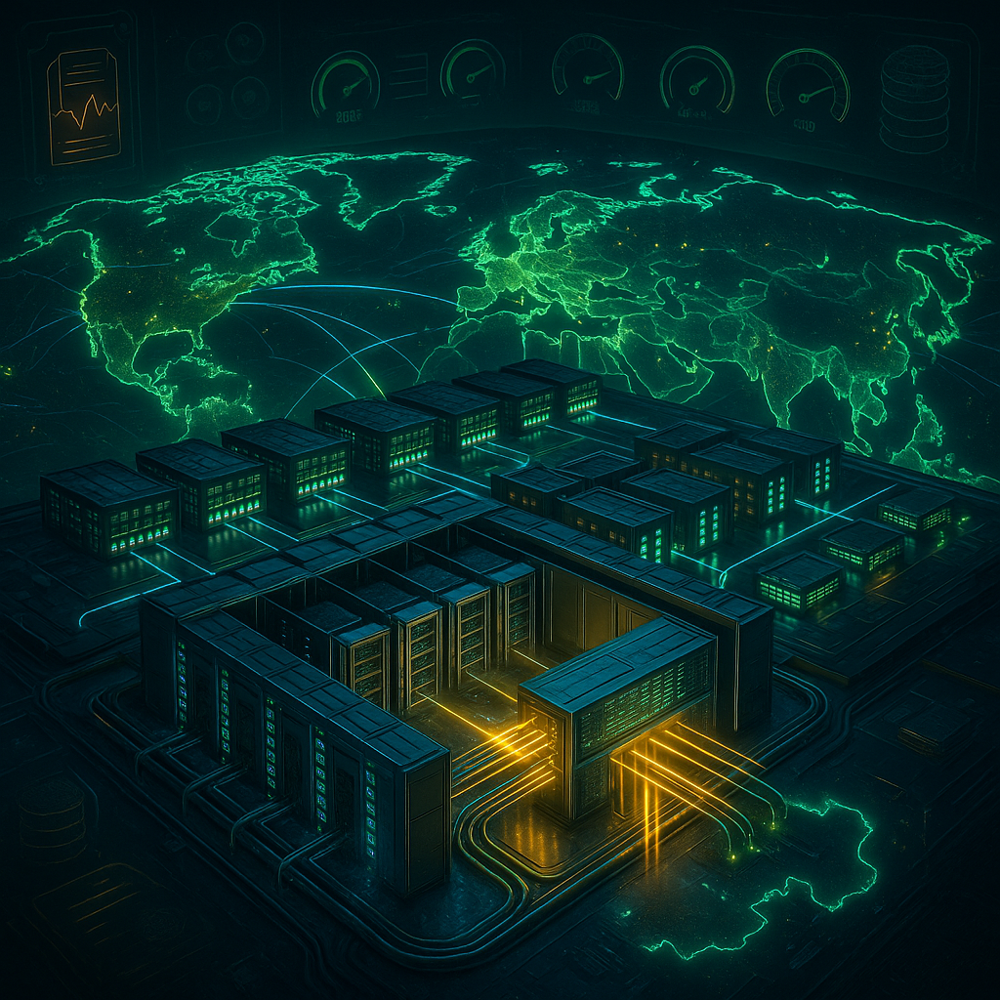

In [ ]:
from IPython.display import Image, display

display(Image(url=result['image_url']))


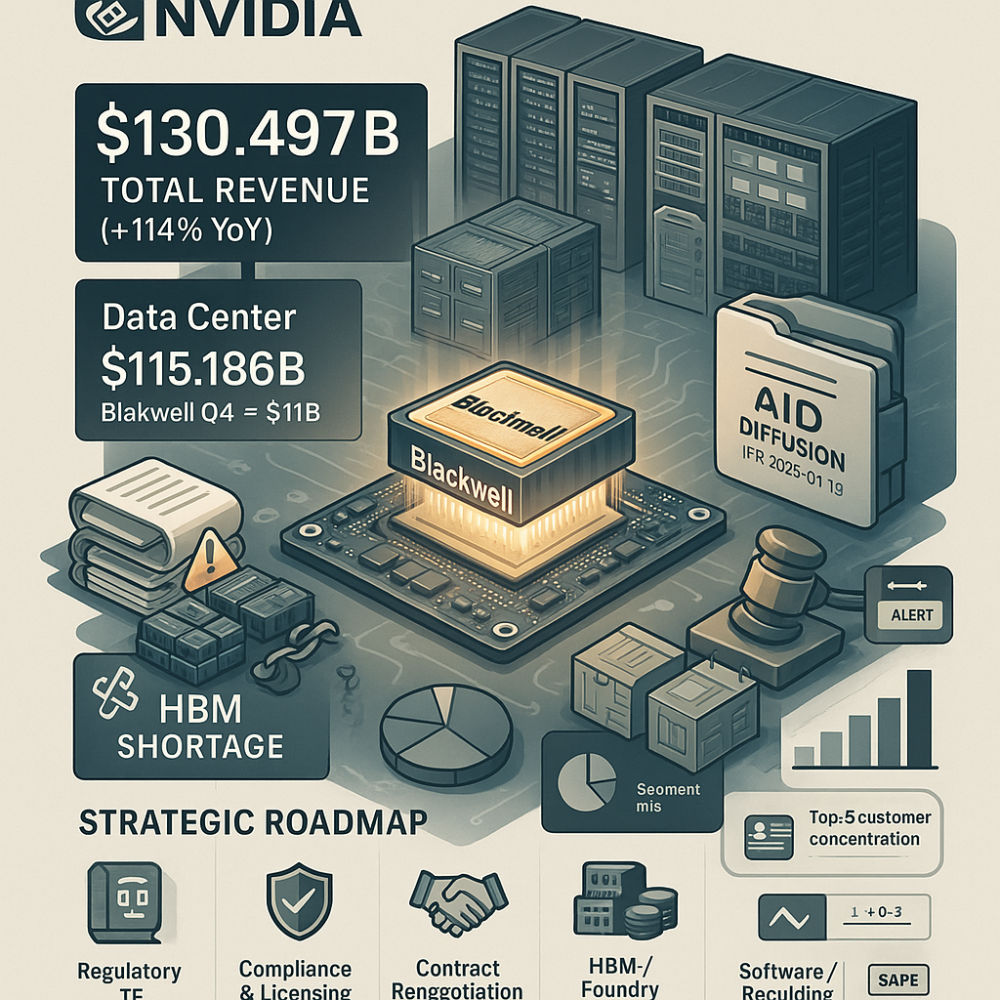

In [ ]:
# display(Image(url=result['image_url']))


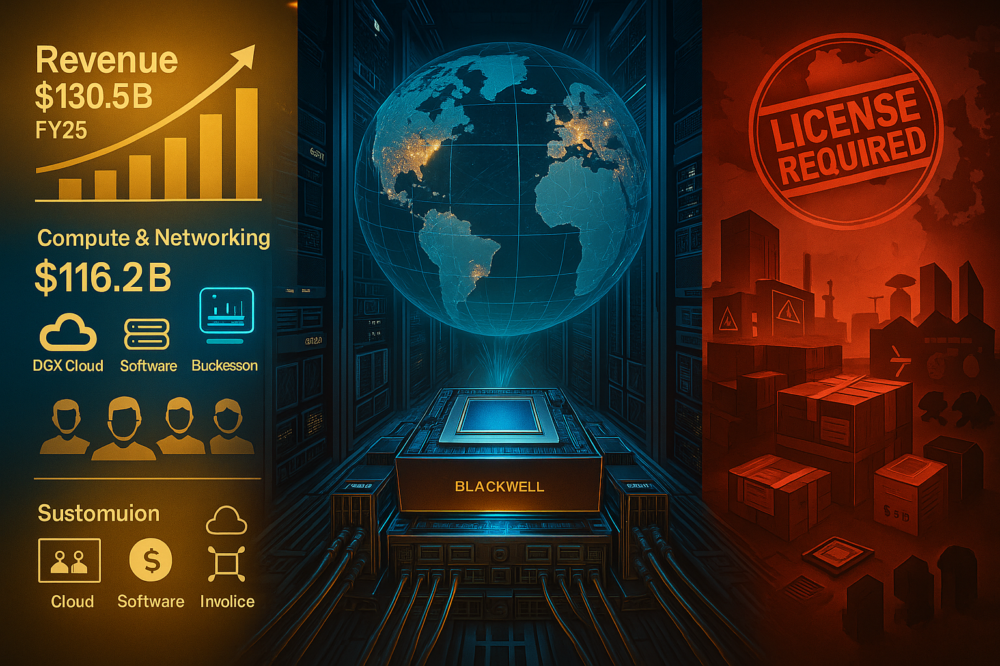

In [ ]:
# display(Image(url=result['image_url']))

# **[참고] 중간 단계 내용 확인**

## **10-K 문서 분석 노드**

In [ ]:
from IPython.display import Markdown

summary_10k = result['summary_10k'][0]
Markdown(summary_10k)

NVIDIA 10-K 분석 보고서: 2024 회계연도 → 2025 회계연도 매출 추이와 견인 요인

요약
- 총매출: 60,922백만달러(‘24) → 130,497백만달러(‘25), 전년 대비 +114%(+69,575백만달러).
- 핵심 동력: 데이터센터 사업 폭증(Generative AI/LLM 훈련·추론용 Hopper 플랫폼 수요, Blackwell 출하 개시, Ethernet for AI 확산), 고성능 네트워킹(특히 Ethernet, Spectrum‑X) 동반 성장.
- 수익성: 제품믹스의 데이터센터 비중 확대로 총이익률 72.7% → 75.0%(+2.3%p). 다만 재고 관련 비용(충당·약정) 영향은 지속.
- 리스크/변동성: 미국 수출통제(특히 2025.1 AI Diffusion IFR) 확대 가능성, 제품 전환(아키텍처/SKU) 복잡도, 공급망·수요 매칭 난이도, 고객 집중도, 경쟁 심화.

1) 매출 추이(요약 수치)
- 총매출: 130,497 (+114%)
- 순이익: 72,880 (+145%), 희석 EPS: 2.94달러
- 총이익률: 75.0% (전년 72.7%)
- 영업이익: 81,453 (+147%)

2) 부문/엔드마켓별 상세
A. Compute & Networking(데이터센터/네트워킹/오토·임베디드/클라우드)
- 매출: 47,405 → 116,193, +145%
- 영업이익: 32,016 → 82,875, +159%
- 엔드마켓 분해(데이터센터 합계 115,186, +142%)
  - 데이터센터 Compute: 38,950 → 102,196, +162%
    • 주요 견인: Hopper 아키텍처(대규모 LLM·추천·생성형 AI), CUDA·라이브러리·SDK, AI Enterprise, DGX Cloud.
    • Blackwell 아키텍처: FY25 4분기부터 생산 시스템 출하 개시(차세대 성능·효율로 FY26 이후 수요 지속 견인 예상).
  - 데이터센터 Networking: 8,575 → 12,990, +51%
    • 주요 견인: Ethernet for AI 수요 급증, Spectrum‑X 포함한 End‑to‑End 이더넷 플랫폼, 대규모 GPU 클러스터의 데이터센터 단위 확장.
- 오토모티브(해당 세그먼트 포함): 1,091 → 1,694, +55%(자율주행 플랫폼·소프트웨어 정의 차량 채택 확대).

B. Graphics(게이밍/프로비주얼/클라우드 게이밍 등)
- 매출: 13,517 → 14,304, +6%
- 영업이익: 5,846 → 5,085, -13% (세그먼트 비용 +44% 증가 영향)
- 세부:
  - 게이밍: 10,447 → 11,350, +9%
    • GeForce RTX 40 시리즈 판매 견조. FY25에 Blackwell 기반 RTX 50 시리즈 발표(신경망 그래픽스·차세대 DLSS 도입)로 성능/시각 품질 도약.
    • 1억대+ AI‑Capable RTX PC, 700개+ RTX AI 지원 앱/게임 기반의 로컬 AI 수요 부상.
  - 프로페셔널 비주얼라이제이션: 1,553 → 1,878, +21%
    • Ada RTX 워크스테이션 램프 및 생성형 AI 기반 설계/시뮬레이션/엔지니어링 워크플로 확산.
  - OEM & 기타: 306 → 389

3) 지역/고객 동향
- 지역(고객 청구지 기준, FY25): 미국 61,257(↑), 싱가포르 23,684, 대만 20,573, 중국(홍콩 포함) 17,108, 기타 7,875.
  - 주: 싱가포르는 인보이싱 허브로 활용(선적 기준 비중은 2% 미만). 해외 매출 비중 53%(전년 56%).
  - 중국: 2023.10 수출통제 이후 FY25에 데이터센터 매출이 성장했으나, 통제 전 수준에는 미달. 중국 전용 설계 제품으로 대응 중.
- 고객 집중도(FY25, 직판 기준): 고객 A 12%, B 11%(전년 13%), C 11%. 간접 고객 중 한 곳은 총매출의 10% 이상 추정(시스템통합·유통 채널 포함).

4) 수익성/운영 지표
- 총이익률: 75.0%(+2.3%p) — 고마진 데이터센터 믹스 확대 효과.
- 재고/구매 약정:
  - 재고자산: 10,080(전년 5,282). 재고충당·초과구매약정 비용 FY25 3.7B/2.0B(총이익률에 -2.3%p 영향).
  - 장기·단기 구매의무: 재고구매 및 공급·캐파 약정 30.8B, 기타 구매의무 14.3B(클라우드 서비스 10.9B 포함).
  - FY26 CapEx 증가 계획(‘25: 3.4B) — 데이터센터 성장 대비 인프라 투자 확대 시사.
- 운전자본: 매출채권 9,999 → 23,065로 증가(매출 급증/대형 고객·시스템통합사 거래 증가에 따른 규모효과).

5) 성장 견인 요인(2024 → 2025)
- 초거대 AI 투자 사이클의 본격화
  - CSP/소비자 인터넷 대기업의 LLM 훈련·추론 인프라 증설(수만 노드 규모 GPU 클러스터), 데이터센터가 ‘연산의 단위’로 전환.
  - NVIDIA 풀스택(실리콘–시스템–네트워킹–CUDA–라이브러리/프레임워크–소프트웨어/서비스)의 통합 가치.
- Hopper 플랫폼의 대중화 + Blackwell 도입 시작
  - Hopper(H100/H200)의 대규모 채택이 FY25 데이터센터 Compute 폭증을 견인.
  - FY25 4분기 Blackwell(B200, GB200 NVL72/36 등) 출하 개시 — 성능/효율/사용처 확대(고성능 추론, 에이전트형 AI 등)로 FY26 수요 파이프라인 강화.
- 네트워킹의 병목 해소
  - InfiniBand에 더해 Ethernet 기반 AI 네트워킹(Spectrum‑X 포함) 수요가 폭발, 대규모 클러스터 상호연결 가속 — 네트워킹 매출 +51%.
- 소프트웨어·서비스의 동반 성장
  - NVIDIA AI Enterprise(엔터프라이즈용 AI OS), DGX Cloud(완전관리형 AI‑훈련‑as‑a‑Service) 등 구독/서비스형 매출 기여.
- RTX 에코시스템 확장
  - AI PC/크리에이터/게임·앱의 RTX AI 기능 확대, RTX 50 시리즈 출시로 하이엔드 수요 자극.

6) 리스크·제약 요인
- 수출통제/규제
  - 2023.10 대중 수출통제 강화에 이어 2025.1 “AI Diffusion” 임시최종규정(IFR): ECCN 3A090.a/4A090.a 해당 전세계 라이선스 요건(대상: A/H/B 시리즈, GB200, L4/L40S, RTX 6000 Ada 등 시스템/보드/IC 및 관련 소프트웨어/기술).
  - 중국/중동/동남아 일부 국가 포함한 D1/D4/D5 그룹 제한, ‘UVEU/NVEU’ 검증체계 등으로 글로벌 판매·사후지원·R&D 일정·공급망 복잡성 증가 가능.
- 제품 전환·공급망 복잡도
  - 연례 아키텍처 주기(빠른 신제품/다양한 구성) 도입으로 수요예측 난이도·품질/생산 리스크·재고·약정비용 변동성 확대.
  - FY25 2분기 Blackwell 초기 저수율 자재 관련 재고충당이 총이익률에 부담.
- 고객 집중/경쟁
  - 대형 CSP/소비자인터넷 기업·시스템통합사·유통사의 집중도와 신용/집행력 의존.
  - 경쟁 심화(AMD/Intel/중국·유럽·이스라엘 계열 가속기, 대형 클라우드의 자체 실리콘, 이더넷/스위칭 반도체 경쟁 등).
- 매크로·운영
  - 에너지/데이터센터 용량·입지·전력/수자원 규제 등 인프라 제약.
  - 지정학적 리스크(대만/한중/이스라엘 등 공급망·R&D 거점), 환율·금리·물류.

7) 종합 평가
- ‘25년은 데이터센터(Compute+Networking)가 사실상 전체 성장의 대부분을 설명(총매출 증가분 69.6B 중 데이터센터 증가분이 67.7B). Hopper 대중화와 Ethernet‑기반 AI 네트워킹 확산이 ‘질적 성장’을 동반했고, Blackwell의 출하 개시로 차세대 사이클의 초기 징후가 반영됨.
- 수익성은 고마진 데이터센터 믹스 확대로 구조적으로 상향. 다만, 빠른 제품주기/대규모 공급 약정에 따른 재고/약정 리스크 관리가 핵심 과제.
- 지역·규제 환경은 매출 경로에 직접적 영향. FY25 중국 데이터센터는 전용 SKU로 회복 조짐이나 통제 전 수준에는 미달. 2025년 발표된 AI Diffusion IFR의 시행 여부·조건은 중장기 경쟁지형과 지역별 매출경로에 중대한 변수.
- 게이밍/프로비주얼은 안정적 성장으로 전체 포트폴리오의 변동성 완충 역할. RTX 50, 생성형 AI의 로컬 활용 확대로 중기적 업사이드가 존재.

부록: 핵심 수치(FY24 → FY25)
- 총매출: 60,922 → 130,497 (+114%)
- 총이익률: 72.7% → 75.0% (+2.3%p)
- 영업이익: 32,972 → 81,453 (+147%)
- 순이익: 29,760 → 72,880 (+145%)
- 세그먼트 매출
  • Compute & Networking: 47,405 → 116,193 (+145%)
  • Graphics: 13,517 → 14,304 (+6%)
- 엔드마켓 매출
  • 데이터센터: 47,525 → 115,186 (+142%) — Compute 38,950 → 102,196 (+162%), Networking 8,575 → 12,990 (+51%)
  • 게이밍: 10,447 → 11,350 (+9%)
  • 프로비주얼: 1,553 → 1,878 (+21%)
  • 오토모티브: 1,091 → 1,694 (+55%)
- 지역(고객 청구지)
  • 미국 26,966 → 61,257, 싱가포르 6,831 → 23,684, 대만 13,405 → 20,573, 중국(홍콩 포함) 10,306 → 17,108
- 재고·약정
  • 재고 5,282 → 10,080
  • 재고충당/초과구매약정 비용: 3.7B/2.0B(총이익률 영향 -2.3%p)
  • 장래 구매의무 합계 45.1B(‘26 35.7B 집중), 이중 재고·공급·캐파 약정 30.8B, 기타 14.3B(클라우드 10.9B)
- CapEx: 1.1B → 3.4B(‘26 증액 계획)

결론
NVIDIA의 2025 회계연도 실적은 생성형 AI 인프라에 대한 전방의 구조적 CapEx 사이클과 풀스택 경쟁력(가속기–네트워킹–소프트웨어/서비스)이 결합되며 ‘질적·양적’ 성장을 동시에 달성한 사례다. Hopper가 ‘당기 실적’을, Blackwell이 ‘차기 사이클’을 각각 견인하는 이중 엔진 체제가 정착되는 중이다. 다만, 대형 규제 변수(AI Diffusion IFR), 제품 전환 복잡도, 공급망·약정 리스크, 고객 집중/경쟁 심화에 대한 기민한 관리가 향후 성장의 지속 가능성을 좌우할 것이다.

## **연례 보고서 분석 노드**

In [ ]:
summary_annual = result['summary_annual'][0]
Markdown(summary_annual)

다음은 NVIDIA 2025 회계연도(2024.1.29–2025.1.26) 연례 보고서에 근거한 2024→2025 회계연도 매출 추이와 성장 견인 요인에 대한 상세 분석입니다.

1) 전체 실적 및 추이 요약
- 매출: 1305억 달러(+114% YoY, 전년 609억 달러)
- 총이익률(Gross margin): 75.0%(+2.3%p YoY)
- 영업이익: 815억 달러(+147% YoY)
- 희석주당순이익(EPS): 2.94달러(+147% YoY)
- 4분기(2025 회계연도 4Q): 매출 393억 달러(+78% YoY, +12% QoQ), 순이익 221억 달러, 영업현금흐름 166억 달러

핵심 포인트
- 매출 증분 696억 달러 중 절대다수(약 97%)가 데이터센터(Data Center)에서 발생
- 데이터센터 내에서도 Compute(가속 컴퓨팅) 부문이 증가분의 약 91%를 차지
- 제품 믹스가 데이터센터 중심으로 개선되며 총마진이 2.3%p 상승
- 운영 레버리지 극대화: 매출 +114% 대비 영업비용 +45%에 그쳐 영업이익률이 큰 폭 확장(62.4% vs 54.1%)

2) 세그먼트/엔드마켓별 매출 추이(전년 대비)
- 세그먼트
  - Compute & Networking: 1162억 달러(+145%), 영업이익 828억 달러(+159%)
  - Graphics: 143억 달러(+6%), 영업이익 51억 달러(–13%)
- 엔드마켓
  - 데이터센터: 1152억 달러(+142%)
    • 세부: Compute 1022억 달러(+632억 달러), Networking 130억 달러(+44억 달러)
  - 게이밍: 114억 달러(+9%) – RTX 40 시리즈 견인, 말 분기 RTX 50 시리즈 출시 개시
  - 프로페셔널 비주얼라이제이션: 19억 달러(+21%) – Ada RTX 워크스테이션과 생성형 AI 기반 워크플로 확산
  - 오토모티브: 17억 달러(+55%) – DRIVE 채택 확대, 본격 양산 램프는 2026 회계연도 예상
  - OEM & 기타: 3.89억 달러

3) 2025 회계연도 성장의 1차 견인: 데이터센터(Compute 중심)
- 수요 본질
  - LLM/생성형 AI/추천엔진 등 대규모 AI 워크로드 급증 – Hopper(H100/H200) 플랫폼 수요 폭발
  - ‘훈련’에서 ‘추론(Reasoning)’으로의 무게 중심 이동: 테스트-타임 스케일링, 장문맥, 도구사용까지 포함하는 ‘에이전틱(agentic) AI’가 실제 배포 단계 진입
  - 연산 효율·총소유비용(TCO) 최적화를 요구하는 실시간 추론/에이전트 워크로드 확산이 GPU 수요를 구조적으로 증폭
- 제품/로드맵
  - Hopper 플랫폼 대규모 수요가 연간 성장을 주도
  - Blackwell의 4분기 본격 출하: 4Q에만 Blackwell 매출 110억 달러(역대 최단기간 램프), 2026 회계연도에는 Blackwell Ultra로 성능/효율 추가 도약 예정
  - Grace CPU, NVLink 5/NVSwitch, InfiniBand(Quantum)·Ethernet(Spectrum)·CX/BlueField DPU의 ‘풀스택’ 통합으로 ‘AI 팩토리(대형 집적 시스템)’ 구축 수요 흡수
  - 소프트웨어 스택: CUDA-X, TensorRT-LLM, cuDNN, NCCL 등 도메인 특화 라이브러리 + NeMo/NIM/AI Blueprints(컨테이너화된 추론 마이크로서비스)로 기업 배포 가속
  - DGX Cloud/AI Enterprise(유상 라이선스) 제공 – 하드웨어 외 소프트웨어/서비스 수익화 축 확대
- 고객/생태계
  - 하이퍼스케일러(아마존·MS·구글·오라클) 선주문 확대, Blackwell 투자를 Hopper 정점보다 상회
  - 소버린 AI(일본·프랑스·인도·캐나다 등)·대기업·엣지까지 배포 범위 확장
  - 시스템통합·컨설팅 파트너(딜로이트, 액센츄어 등)와 기업 배포 생태계 강화
- 네트워킹
  - Ethernet for AI(특히 Spectrum-X) 매출 본격화, InfiniBand와 더불어 대규모 클러스터 네트워킹 수요 동반 증가
  - NVLink 스위치 기반 ‘스케일-업’과 InfiniBand/Ethernet 기반 ‘스케일-아웃’ 동시 확대
  - 결과: 네트워킹 매출 +44억 달러로 데이터센터 내 2차 성장축 역할

4) 2차 견인: 비데이터센터(게이밍/프로비주/오토모티브)
- 게이밍(+9%): RTX 40 시리즈가 연간을 견인. 4Q에 Blackwell 기반 RTX 50 시리즈/노트북(배터리수명+40%, AI 네이티브) 런칭으로 2026 회계연도 업사이드 포인트
- 프로페셔널 비주얼라이제이션(+21%): Ada RTX 워크스테이션 수요와 생성형 AI 활용한 설계·시뮬레이션 채택 확산
- 오토모티브(+55%): NVIDIA DRIVE 플랫폼 채택 증가. 2026 회계연도 고객 양산 램프 기대(매출 가시성 개선)

5) 이익률/현금흐름/운영 레버리지
- 총이익률 75.0%(+2.3%p): 데이터센터 믹스 개선 효과. 다만 재고 관련 비용이 연중 –2.3%p 역풍(재고충당금 37억 달러, 환입 6.89억 달러)
- 영업비용 164억 달러(+45%): 인력·컴퓨팅 인프라·공급망·개발 등에 지속 투자. 매출 성장(+114%)을 크게 하회하여 영업 레버리지 기여
- 영업현금흐름 641억 달러(전년 281억 달러): 현금창출력 대폭 확장
- 주주환원: 자사주 매입 337억 달러, 배당 8.34억 달러
- 운전자본: 매출채권 230억 달러(전년 100억 달러), 재고 101억 달러(전년 53억 달러) – 고성장 국면과 신제품 전환에 따른 자연적 증가
- 선급/커밋: 선급공급·용량(prepaid) 약 50억 달러(단·장기 합산), 재고·장기공급·용량 의무 308억 달러(전년 대비 확대) – 공격적 공급확보 전략

6) 지역/고객 구조의 변화
- 지역(청구지 기준): 미국 612억 달러(전년 270억 달러), 싱가포르 236억 달러(청구지 집중, 실출하 <2%), 대만 206억 달러, 중국(홍콩 포함) 171억 달러
  • 미국 비중 확대는 미국 내 데이터센터 수요 급증 영향
  • 중국 데이터센터 매출은 전년 대비 성장했으나 2023년 10월 수출통제 이전 대비 여전히 낮은 수준(전사 코멘트)
- 고객 집중도:
  • 상위 3개 ‘직접’ 고객이 각각 12%, 11%, 11% – 모두 Compute & Networking에서 발생
  • ‘간접’ 고객(시스템 통합/유통 경유 포함) 중 1곳은 전사 매출 ≥10%로 추정
  → 하이퍼스케일러/대형 SI 중심 대형 수주 구조가 명확, 단기 실적 가시성을 높이는 한편 중장기 집중 리스크도 내재

7) 제품 전환과 분기 내 흐름
- Hopper에서 Blackwell로의 세대 전환이 4분기에 가시화(Blackwell 매출 110억 달러) – 2026 회계연도에는 Blackwell Ultra 도입으로 추가 성능/메모리/효율 개선
- 데이터센터는 ‘연 1회’ 아키텍처 주기 체계로 고도화 – 다양한 SKU/구성이 동시 전개되어 공급/수요 계획 난이도는 증가(보고서 내 경고)
- 2분기 기준으로 Blackwell 저수율에 따른 재고충당금으로 분기 총마진에 일시적 역풍 발생(연간 총마진은 믹스 개선으로 확장)

8) 리스크와 제약 요인(경영진 코멘트 요약)
- 수출통제: 2023년 10월 대중(및 일부 D1/D4/D5) 수출규제 강화, 2025년 1월 ‘AI Diffusion IFR’(3A090.a/4A090.a 등급 전 세계 라이선스 요건) 예고
  • 중국/중동/기타 Tier 2 국가로의 공급에 불확실성 상존 – 재고/주문/제품(SKU) 전략 복잡성 및 비즈니스 전개 지연 가능성
  • 중국 시장용 비허가(license-free) 제품 라인업을 램프했으나, 중장기에는 규제 추가 변화 리스크 지속
- 공급망: 공급 커밋 308억 달러, 총 구매의무 450억 달러 – 대규모 수요 충족능력은 확보했으나, 제품 다양화·전환빈도 증가로 수급·수율·품질 관리 난이도 상승
- 고객 집중: 상위 고객 및 특정 지역(미국) 편중도 증가
- 경쟁: 자체 칩(하이퍼스케일러), 경쟁사 GPU/가속기, 네트워킹 대체안 등. 그러나 현재 풀스택 우위(하드·네트워크·소프트웨어·생태계)로 경쟁력 견고

9) 회계/현금지표에서 본 성장의 질
- 이익의 질: 총마진 확대, OPEX 효율, 강력한 현금창출력(OCF 641억 달러), 대규모 선급/커밋 기반 공급안정성 → 고성장 구간에서 ‘질적’ 지표 양호
- 재고/충당금: 급성장·신제품 전환에 필연적 동반. 2025 회계연도 순효과로 총마진 –2.3%p 영향. 재고 101억 달러는 Blackwell/Hopper 동시 운영의 부산물
- 이연수익(Deferred revenue): 181억 달러(전년 134억 달러) – 고객선수·지원/소프트웨어/클라우드 등 구독성 수익 증가

10) 2026 회계연도 시사점(보고서 내 가시 정보 기준)
- Blackwell의 본격 연간 반영, Blackwell Ultra 도입
- 추론·에이전틱 AI 가속(테스트-타임 스케일링, 긴 문맥, 멀티모달 등) → 연산 수요 구조적 증가
- 네트워킹: Ethernet for AI(Spectrum-X)·NVLink의 매출 기여 확대 지속
- 오토모티브: 고객 양산 램프 개시 전망(2026 회계연도)
- 게이밍/프로비주: RTX 50 시리즈/AI PC·AI 워크스테이션 확산의 후행효과

부록) 숫자로 본 성장 기여도(2024→2025)
- 총 매출 증가: +695.8억 달러
  • 데이터센터 Compute: +632.5억 달러(증가분의 약 91%)
  • 데이터센터 Networking: +44.2억 달러(약 6%)
  • 게이밍/프로비주/오토모티브/OEM&기타 합산: +10.1억 달러(약 1.5%)

결론
- 2025 회계연도 실적은 ‘AI 팩토리’ 시대 개막과 함께 데이터센터 가속컴퓨팅·네트워킹에 집중된 초고속 성장의 해로 요약됩니다. Hopper 수요가 연간 성장을 이끌었고, 4분기부터 Blackwell이 본격 기여하며 세대 전환이 진행되었습니다. 추론/에이전틱 AI의 상용화가 GPU 연산·메모리·네트워킹 전반의 수요를 구조적으로 확대했고, NVIDIA는 하드웨어(Blackwell/Grace/NVLink/InfiniBand·Ethernet)와 소프트웨어(CUDA-X, TensorRT-LLM, NIM 등)를 포괄하는 풀스택 경쟁력으로 수요를 흡수했습니다.
- 비데이터센터 부문도 플러스 성장(게이밍/프로비주/오토모티브)으로 전사 체질을 보완했습니다. 총마진은 믹스 개선으로 확대되었고, 재고충당금/신제품 전환 비용에도 불구하고 영업레버리지를 크게 실현했습니다.
- 2026 회계연도에는 Blackwell의 연간 효과, Blackwell Ultra, 오토모티브 램프, 네트워킹 매출 비중 증가가 추가 성장 동력이 될 전망입니다. 다만, 대중 수출통제 및 ‘AI Diffusion IFR’ 등 규제 리스크, 대형 고객 집중도, 공급망 복잡성은 상시 관리 포인트입니다. 전체적으로는 ‘풀스택·풀시스템·풀에코시스템’ 전략의 결실로, 데이터센터 중심의 초과성장을 이어갈 여지가 큰 것으로 판단됩니다.

## **관련 뉴스 분석 노드**

In [ ]:
news = result['news'] if isinstance(result['news'], str) else result['news'][0]['text']
Markdown(news)

아래는 주어진 두 개의 분석 보고서에서 도출한 핵심 주제별(데이터센터/Blackwell 램프, AI 네트워킹·Ethernet for AI, 수출통제·AI Diffusion IFR, RTX 50·AI PC) 관련 최신 뉴스 기사 수집과 보고서 삽입용 요약입니다. 모든 요약은 기사 원문과 제공된 분석 보고서에 근거했으며, 기사별 URL을 코드로 명시했습니다.

주제 1) 데이터센터 성장과 Blackwell 램프(Compute 중심)  
- 기사 1: NVIDIA, 2025 회계연도 4분기 및 연간 실적 발표
  - URL: `https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-fourth-quarter-and-fiscal-2025`
  - 요약: 2025년 2월 26일 발표에서 NVIDIA는 4분기 매출 393억 달러(+78% YoY), 연간 매출 1,305억 달러(+114% YoY)를 공개하며 데이터센터 매출이 4분기에만 356억 달러로 전년 대비 93% 성장했다고 밝혔다. 경영진은 Blackwell AI 슈퍼컴퓨터의 “대규모 양산 램프”가 첫 분기부터 “수십억 달러”의 매출을 창출했다고 강조해, 보고서의 ‘Hopper가 당기, Blackwell이 차기 사이클을 견인’한다는 논지를 뒷받침한다. 수요는 LLM 훈련·추론과 ‘에이전틱 AI’ 확산에 의해 폭넓게 분산되며, 풀스택(가속기–네트워킹–소프트웨어) 전략이 대규모 수주를 흡수하는 구조가 명확해졌다. 총마진은 고마진 데이터센터 믹스 확대로 유지되었지만, 제품 전환과 재고 관련 비용이 분기 내 변동성을 유발함을 수치로 확인할 수 있다. 사업 관점에서 이는 FY26에 Blackwell의 연간 반영과 고객 선주문 확대가 매출 가시성을 더욱 높일 신호이며, 동시에 수율·SKU 복잡도 관리가 재무지표에 미치는 영향을 면밀히 추적해야 함을 시사한다. 전사 차원의 운영 레버리지(매출 성장 대비 OPEX 증가율 둔화)는 높은 현금창출력과 자사주 매입 여력을 뒷받침한다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-fourth-quarter-and-fiscal-2025?utm_source=openai))

- 기사 2: GTC 2025에서 발표된 Blackwell Ultra 및 차세대 로드맵(Reuters)
  - URL: `https://www.reuters.com/technology/everything-nvidia-announced-its-annual-developer-conference-gtc-2025-03-18/`
  - 요약: 2025년 3월 18일 GTC에서 NVIDIA는 Blackwell Ultra 플랫폼과 2026년 Rubin(및 후속 라인업) 로드맵을 공개하며, 훈련뿐 아니라 ‘테스트-타임 스케일링(Reasoning·Agentic·Physical AI)’을 위한 추론 성능·효율 향상을 전면에 내세웠다. 이는 10‑K/연례 보고서의 ‘추론·에이전틱 AI’로의 무게중심 이동과 FY26 성장을 가속할 제품 로드맵(Blackwell Ultra) 포인트와 부합한다. 또한 네트워킹(새로운 Spectrum‑X·Quantum‑X 포토닉스)과 소프트웨어(Dynamo 등)가 동시 발표돼 풀스택 차별화가 강화됐다. 시장 측면에서 하이퍼스케일러와 GPU 클라우드의 투자 의사결정을 견인하는 ‘연례 아키텍처 주기’가 명확해지고 있으며, 고객은 TCO·전력·밀도·지연을 모두 고려하는 ‘AI 팩토리’ 관점으로 전환하고 있음을 보여준다. 기업 고객의 경우, 추론 레이턴시·응답률 개선에 따른 서비스 품질향상이 직접적인 수익화(검색·광고·콘텐츠)로 연결될 가능성이 크다. 다만 제품 전환 초기의 수율 리스크는 보고서가 지적한 바와 같이 총마진 단기 변동 요인으로 잔존한다. ([reuters.com](https://www.reuters.com/technology/everything-nvidia-announced-its-annual-developer-conference-gtc-2025-03-18/?utm_source=openai))

- 기사 3: CoreWeave, 최초로 GB300 NVL72(Blackwell Ultra 세대) 플랫폼 상용 배치
  - URL: `https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx`
  - 요약: 2025년 7월 3일 CoreWeave는 NVIDIA GB300 NVL72 시스템을 고객 워크로드에 최초 도입했다고 발표했다. 회사는 Blackwell 대비 추론 지연·처리량·전력효율에서 대폭 개선(사용자 응답성 최대 10배, 전력 대비 처리량 5배, 추론 출력 50배)을 제시하며, 에이전틱/리저닝 워크로드의 상용화를 본격화했다. 이는 보고서가 강조한 ‘추론·에이전틱 AI로의 수요 이동’과 Blackwell의 FY26 기여 확대를 실증하는 고객 사례다. 파트너 생태계(서버 OEM, 냉각/전력 인프라 공급업체, 관측·스케줄링 소프트웨어)와의 동반 램프는 데이터센터가 ‘연산의 단위’로 확장되는 구조를 뒷받침한다. 비즈니스 관점에서 하이퍼스케일러·네오클라우드의 선제적 캐파 확보는 NVIDIA의 장기 공급약정·선급 커밋과 맞물려 매출의 가시성과 내재 성장률을 높인다. 다만 급격한 확장은 고객·지역 집중도 및 전력·입지·규제(에너지/용수)의 외생 변수에 좌우될 수 있음을 시사한다. ([investors.coreweave.com](https://investors.coreweave.com/news/news-details/2025/CoreWeave-Becomes-First-Hyperscaler-to-Deploy-NVIDIA-GB300-NVL72-Platform/default.aspx?utm_source=openai))


주제 2) AI 네트워킹 전환(Ethernet for AI, Spectrum‑X/Spectrum‑XGS/Photonics)  
- 기사 1: Spectrum‑X Ethernet 채택 본격화(Computex 2024)
  - URL: `https://nvidianews.nvidia.com/news/nvidia-supercharges-ethernet-networking-for-generative-ai`
  - 요약: 2024년 6월 2일 NVIDIA는 CoreWeave, Lambda, Scaleway 등 GPU 클라우드와 Dell·HPE·Lenovo 등 주요 시스템 메이커가 Spectrum‑X 기반 제품을 출시·채택 중임을 발표했다. 이는 보고서의 ‘Ethernet for AI 확산’과 데이터센터 네트워킹 매출 +51% 성장 포인트를 시장 사례로 확인시켜 준다. 인피니밴드와 병행해 이더넷 생태계가 엔터프라이즈·멀티테넌트 환경에서 대규모 AI 클러스터를 지탱하는 축으로 부상하고 있음을 보여준다. 기업 입장에서는 기존 이더넷 운영경험과 도구를 활용해 AI 워크로드로 확장할 수 있어 TCO·운영 단순화 이점이 크다. 경쟁 관점에서 표준 이더넷 진영의 성능·지연 개선은 ‘전용 패브릭 종속’ 리스크를 줄이는 효과가 있다. 이는 보고서의 ‘네트워킹 병목 해소’와 매출 2차 성장축 논지를 지지한다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-supercharges-ethernet-networking-for-generative-ai?utm_source=openai))

- 기사 2: Cisco–NVIDIA 파트너십 확대(기업형 AI 데이터센터 네트워킹)
  - URL: `https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934`
  - 요약: 2025년 2월 25일 Cisco는 자사 Silicon One을 NVIDIA SuperNIC과 결합해 Spectrum‑X 플랫폼의 일부로 통합하는 계획을 발표했다. 이는 기업형 데이터센터에서 프런트엔드–백엔드 네트워크를 아우르는 통합 아키텍처를 제공, AI 워크로드의 저지연·고효율 요건을 만족시키는 구성을 선택지로 제시한다. 고객사는 Cisco OS·운영툴과 NVIDIA 스펙트럼 실리콘을 함께 표준화하여 벤더 락인을 완화하는 동시에 성능을 확보한다. 비즈니스적으로는 Cisco가 엔터프라이즈 채널·서비스 역량을, NVIDIA가 AI 가속·네트워킹 IP를 제공해 상호 보완적 유통·생태계 확장을 꾀한다. 보고서의 ‘Ethernet for AI 확산’과 엔터프라이즈 채택 가속을 실증하는 협력이다. ([newsroom.cisco.com](https://newsroom.cisco.com/c/r/newsroom/en/us/a/y2025/m02/cisco-expands-partnership-with-nvidia-to-accelerate-ai-adoption-in-the-enterprise.html?ncid=so-twit-567934&utm_source=openai))

- 기사 3: Spectrum‑X 포토닉스(Co‑packaged optics) 스위치 공개(GTC 2025)
  - URL: `https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories`
  - 요약: 2025년 3월 18일 NVIDIA는 포토닉스 기반 스위치를 공개하며 포트당 1.6Tbps, 전력효율 3.5배, 신호무결성 63배 개선 등 초대형 AI 팩토리의 네트워킹 병목을 근본적으로 완화할 로드맵을 제시했다. TSMC·Coherent·Corning 등과의 협업은 광학 통합과 공급망 측면의 실행 가능성을 담보한다. 이는 보고서의 ‘데이터센터가 연산의 단위로 확장’되는 추세에서 수백만 GPU 규모로 스케일하는 필수 인프라로 평가된다. 에너지·냉각·랙 밀도 제약 하에서 네트워크 효율 개선은 TCO 절감과 설치공간 최적화에 직결된다. 경쟁 구도상, 이더넷과 인피니밴드 모두에서 광집적 전환이 가속화되어 대체 기술 대비 차별화 포인트가 확대된다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-spectrum-x-co-packaged-optics-networking-switches-ai-factories?utm_source=openai))

- 기사 4: Spectrum‑XGS(Scale‑Across) — 분산 데이터센터를 ‘기가스케일 AI 슈퍼팩토리’로 연결
  - URL: `https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx`
  - 요약: 2025년 8월 22일 발표된 Spectrum‑XGS는 ‘스케일‑업/아웃’에 더해 ‘스케일‑어크로스’를 도입, 여러 데이터센터를 하나의 거대 AI 팩토리로 동작하게 하는 이더넷 기술이다. 거리 기반 혼잡 제어와 지연 정밀관리, E2E 텔레메트리를 통해 지리적으로 분산된 클러스터의 통신 성능을 끌어올린다. CoreWeave의 초기 도입은 네오클라우드 사업자들이 다(多)사이트 확장을 통해 전력·입지 제약을 회피하려는 전략과 맞닿아 있다. 사업적으로 멀티리전·크로스사이트 워크로드를 단일 자원 풀로 운영할 수 있어 활용률과 수익성을 높일 수 있다. 이는 보고서의 네트워킹 매출 확대와 FY26 이후 지속적 기여 전망을 구체화한다. ([investor.nvidia.com](https://investor.nvidia.com/news/press-release-details/2025/NVIDIA-Introduces-Spectrum-XGS-Ethernet-to-Connect-Distributed-Data-Centers-Into-Giga-Scale-AI-Super-Factories/default.aspx?utm_source=openai))


주제 3) 수출통제·규제(AI Diffusion IFR) 변화와 중국 매출 경로 불확실성  
- 기사 1: BIS, AI Diffusion IFR(Interim Final Rule) 공표 — 전 세계 라이선스 요건·모델 웨이트 통제 도입
  - URL: `https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025`
  - 요약: 2025년 1월 15일 미 상무부 BIS는 고급 AI 칩(ECCN 3A090.a/4A090.a 등)과 특정 ‘폐쇄형’ 고급 AI 모델 웨이트(4E091)에 대한 새로운 통제를 담은 IFR을 고시했다. 효력은 즉시이나 실질적 준수시점은 2025년 5월 15일(일부 조항 2026년 1월 15일)로 설정되어 산업계의 전환 시간을 부여했다. 규정은 UVEU/NVEU 등 검증체계, 면허예외(낮은 리스크 국가·사용자)와 데이터센터 VEU 갱신을 포함해 ‘책임 있는 AI 확산’과 국가안보를 균형 있게 지향한다. 보고서가 지적한 글로벌 판매·사후지원·R&D 일정을 복잡하게 할 수 있는 변수로, 중국·중동 등 특정 지역 매출 경로의 가시성에 직접적 영향을 준다. 기업 입장에서는 SKU 전략·재고/약정·수출허가·사후검증 프로세스를 통합적으로 재설계해야 한다. 규정의 글로벌 FDPR 확장 적용은 해외 생산품에도 광범위한 준수를 요구한다. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

- 기사 2: BIS, 2025년 5월 AI Diffusion Rule 사실상 철회(Rescission) 공지
  - URL: `https://www.wiley.law/alert-BIS-Rescinds-AI-Diffusion-Rule`
  - 요약: 2025년 5월 12일 BIS는 1월에 발표된 AI Diffusion Rule을 공식 철회한다고 발표하고, 다음날 고급 연산 IC에 대한 가이던스를 배포했다. 업계·동맹국의 반발과 경쟁력 저하 우려가 주요 배경으로 거론되며, 집행 유예 지시로 실무상 적용이 중단되었다. 이는 보고서의 ‘IFR 시행 여부·조건이 중장기 경쟁지형과 지역별 매출경로에 중대한 변수’라는 평가를 반영한다. 정책 리스크의 변동성은 중국 대응 SKU·라이선스 전략, 간접 채널 관리, 사후지원 체계 등에 중대한 재조정을 요구한다. 기업은 지속되는 정책 시소(see‑saw)에 대비해 지역별 규제 시나리오를 다층적으로 마련해야 한다. 규제의 빈번한 변경은 고객 의사결정 지연과 리드타임 증가로 이어질 수 있다. ([wiley.law](https://www.wiley.law/alert-BIS-Rescinds-AI-Diffusion-Rule?utm_source=openai))

- 기사 3: H20의 중국 판매 재개 기대 — 라이선스 기반 수출 재개 시그널(CNBC)
  - URL: `https://www.cnbc.com/2025/07/15/nvidia-says-us-government-will-allow-it-to-resume-h20-ai-chip-sales-to-china.html`
  - 요약: 2025년 7월 15일 NVIDIA는 H20 GPU의 중국 판매 재개를 위해 미 정부에 라이선스 신청 중이며, 정부로부터 허가 발급이 보장될 것이라는 입장을 전했다. H20는 이전 규제를 회피하도록 설계된 중국 전용 제품군으로, 판매 중단으로 발생한 매출 기회 손실이 경영진 코멘트로도 지적되어 왔다. 라이선스 기반 재개는 보고서의 ‘중국 데이터센터 매출 회복 조짐’과 부합하나, 허가 범위·조건·적용국 변화에 따라 수요 변동성이 상존한다. 동시에 불법 반입·밀수 이슈가 보도되는 등(별도 보도) 시장의 회색지대가 커져 사후지원·서비스를 제공하지 않는다는 기업 정책도 재차 강조되었다. 사업 측면에서 라이선스 기반 모델은 주문·인도 리드타임과 채권·재고 관리 복잡도를 높인다. 전략적으로는 중국 외 지역의 ‘소버린 AI’ 수요가 포트폴리오의 방어막 역할을 할 전망이다. ([cnbc.com](https://www.cnbc.com/2025/07/15/nvidia-says-us-government-will-allow-it-to-resume-h20-ai-chip-sales-to-china.html?utm_source=openai))

- (참고) IFR 공표 당시 업계 반응 및 내용 요약 기사
  - URL: `https://www.reuters.com/technology/artificial-intelligence/us-tightens-its-grip-ai-chip-flows-across-globe-2025-01-13/`
  - 요약: 2025년 1월 13일자 Reuters는 AI 칩 흐름을 3개 권역으로 구분하는 통제틀, 대형 CSP의 데이터센터 구축 인허가, 인권·보안 요건 등의 주요 내용을 정리했다. NVIDIA 등 업계의 과도한 확장 우려, 동맹국과의 조율 이슈가 제기되어 이후 철회와 가이드라인 전환으로 이어지는 맥락을 이해하는 데 유용하다. 정책 변동성은 단기 주문·납기와 장기 매출경로 모두에 리스크로 작용한다. ([reuters.com](https://www.reuters.com/technology/artificial-intelligence/us-tightens-its-grip-ai-chip-flows-across-globe-2025-01-13/?utm_source=openai))


주제 4) RTX 50 시리즈·AI PC(로컬 AI·게이밍/크리에이티브 생태계)  
- 기사 1: RTX 50 시리즈(Blackwell) CES 2025 공개 — DLSS 4, Neural Shaders 등
  - URL: `https://nvidianews.nvidia.com/news/nvidia-blackwell-geforce-rtx-50-series-opens-new-world-of-ai-computer-graphics`
  - 요약: 2025년 1월 6일 NVIDIA는 RTX 5090/5080/5070 Ti/5070과 노트북 라인업을 공개, DLSS 4(멀티 프레임 생성), Reflex 2(프레임 워프), RTX Neural Shaders 등 AI 기반 그래픽스 혁신을 전면에 내세웠다. 데스크톱 상위 모델은 1월 30일, 나머지는 2월 출시 일정으로 공지되었고, 노트북은 3–4월 가용성을 예고했다. 보고서의 ‘RTX 50 발표 및 로컬 AI 확대’와 일치하며, 게이밍/크리에이티브 워크플로의 생산성·품질 향상을 통해 비데이터센터 매출의 완충·업사이드 역할이 기대된다. 소비자 시장에서는 AI TOPS, FP4 지원 등 로컬 생성형 AI 작업의 실제성·속도가 판매 포인트로 부각된다. 엔진·툴체인의 업데이트(Neural Faces, Mega Geometry 등)는 개발자 생태계의 기술 채택을 촉진한다. 가격 포지셔닝은 프리미엄 중심이지만 세대효과로 상위/중위 SKU 수요가 연쇄적으로 자극될 가능성이 있다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/nvidia-blackwell-geforce-rtx-50-series-opens-new-world-of-ai-computer-graphics?utm_source=openai))

- 기사 2: GeForce NOW, RTX 5080 업그레이드로 클라우드 게이밍 성능 향상(The Verge)
  - URL: `https://www.theverge.com/news/771273/nvidia-geforce-now-rtx-5080-upgrade-release-date`
  - 요약: 2025년 9월 10일부터 GeForce NOW가 RTX 5080급 인스턴스로 업그레이드되며 5K/120fps, 1440p/240fps, 1080p/360fps까지 지원한다. DLSS 4·뉴럴 렌더링·풀 레이트레이싱 등 데스크톱 신기능이 클라우드에서도 구현되며, 구독료는 Ultimate 기준 월 19.99달러로 유지된다. 이는 로컬 RTX 50과 클라우드의 상호 보완 모델을 통해 사용자 저변을 확대하고, 소프트웨어·서비스 매출 비중 확대라는 보고서 포인트와 맞닿는다. 타이틀 라인업 확장과 Install‑to‑Play 기능은 진입장벽을 낮춰 이용률과 수익성을 끌어올릴 수 있다. 인프라 측면에선 백엔드의 GPU 투자와 네트워킹 최적화가 서비스 품질을 좌우한다. 엔드유저 경험 강화는 브랜드 충성도 제고로 이어져 하드웨어 업그레이드 의사결정에도 긍정적 영향을 미칠 수 있다. ([theverge.com](https://www.theverge.com/news/771273/nvidia-geforce-now-rtx-5080-upgrade-release-date?utm_source=openai))

- 기사 3: CES 2025 — RTX 5090 등 소비자 라인업과 가격·포지셔닝(TechCrunch)
  - URL: `https://techcrunch.com/2025/01/06/nvidia-unveils-rtx-5090-gpu/`
  - 요약: TechCrunch는 RTX 5090(1,999달러), 5080(999달러), 5070 Ti(749달러), 5070(549달러)의 가격·사양을 정리하며, 신제품이 전세대 대비 최대 2배 성능(데모 기준)을 제시했다고 보도했다. 92B 트랜지스터, 높은 AI TOPS, 레이트레이싱 성능 향상 등 하드웨어 지표는 프리미엄 포지셔닝을 강화한다. 소비자 수요는 초기에는 하이엔드에 집중되나, 개발자·크리에이터 워크로드의 AI 가속 이점이 중장기 수요를 견인할 전망이다. 가격대·전력·폼팩터 측면에서 노트북 라인업의 Max‑Q 개선(배터리수명 개선)은 이동형 크리에이티브 시장을 공략한다. 보고서의 ‘게이밍/프로비주 안정성’과 ‘로컬 AI 활용 확대’ 포인트를 시장 반응과 함께 확인할 수 있다. 다만 초기 재고·드라이버 이슈 등 론치 리스크는 단기적 변동성을 야기할 수 있다. ([techcrunch.com](https://techcrunch.com/2025/01/06/nvidia-unveils-rtx-5090-gpu/?utm_source=openai))


추가 참고: 소프트웨어·서비스 동반 성장(보고서 5번 포인트)  
- 기사: Oracle–NVIDIA, OCI에서 NVIDIA AI Enterprise·NIM을 네이티브 제공
  - URL: `https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference`
  - 요약: 2025년 3월 18일 발표에 따르면, OCI 콘솔에서 NVIDIA AI Enterprise(160+ AI 툴)와 100+ NIM 마이크로서비스를 네이티브 제공해, 엔터프라이즈가 에이전틱 AI 애플리케이션을 신속히 배포할 수 있게 된다. 이는 보고서가 지적한 구독/서비스형 매출 기여와 DGX Cloud/AI Enterprise의 동반 성장을 구체화한다. 고객은 Oracle의 분산 클라우드(공공·주권·전용 리전 등) 전반에서 동일 스택을 활용할 수 있어, 규제·주권 요구를 충족하며 배포 속도를 단축한다. 데이터·보안·레イ턴시 요건을 고려한 하이브리드 배치가 가능해, 기업형 AI의 PoC→프로덕션 전환을 가속할 전망이다. 파트너십은 소프트웨어 라이선스·클라우드 크레딧의 교차 판매 기회를 창출한다. ([nvidianews.nvidia.com](https://nvidianews.nvidia.com/news/oracle-and-nvidia-collaborate-to-help-enterprises-accelerate-agentic-ai-inference?utm_source=openai))


작성 참고  
- 본 수집은 두 분석 보고서의 핵심 이슈(데이터센터 Compute/Blackwell 램프, Ethernet for AI 확산, 수출통제·IFR, RTX 50/AI PC, 소프트웨어·서비스)를 기준으로, 각 주제당 3건 이상 뉴스(공식 발표·주요 외신·고객 도입 사례)를 선별했습니다.  
- 기사별 핵심 수치·주요 코멘트·사업적 함의를 6문장 이상으로 요약해, 경영진 브리핑/IR 자료에 바로 삽입할 수 있도록 구성했습니다.  
- 규제 이슈(‘AI Diffusion IFR’)는 2025년 1월 고시–5월 철회라는 변동이 크므로, 날짜·효력·준수시점 등을 명확히 기술했습니다.

## **경쟁사 정보 수집 노드**

In [ ]:
competitors = result['competitors'] if isinstance(result['competitors'], str) else  result['competitors'][0]['text'] if isinstance(result['competitors'][0], dict) else result['competitors'][0]
Markdown(competitors)

다음 보고서는 제공된 10‑K 분석 요약과 최신 웹 자료에만 기반해, NVIDIA에 대한 경쟁사 “현황”과 “잠재적 위협”을 정리한 것입니다. 각 항목 말미에 근거 URL을 달았으며, 마지막에 출처 URL 목록도 첨부합니다.

요약(Top threats)
- AMD의 가속기 로드맵·소프트웨어 성숙: MI300 계열 상용화와 MI350(2025), MI400(2026 예정) 로드맵, ROCm 6/7의 생태계 확대, MLPerf v5.0 결과 공개로 ‘성능/가격·에너지 효율·개방형 소프트웨어’ 축에서 경쟁 심화. ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))
- 엔터프라이즈·클라우드 대안 가속기 확산: Intel Gaudi 3의 클라우드/서버 OEM 채택, AWS Trainium2 GA(Trainium3 로드맵), Google TPU v6(Trillium) GA 및 7세대 TPU(Ironwood) 발표로 ‘자체 실리콘’ 경로 강화. 가격/총소유비용(TCO)·공급 다변화 측면에서 NVIDIA 점유율 잠식 가능. ([newsroom.ibm.com](https://newsroom.ibm.com/blog-intel-and-ibm-announce-the-availability-of-intel-gaudi-3-ai-accelerators-on-ibm-cloud?utm_source=openai))
- 이더넷 표준화 공세와 네트워킹 경쟁: Ultra Ethernet Consortium(UEC) 1.0 공개, Broadcom 102.4Tbps Tomahawk 6 출하, Arista의 AI 이더넷 플랫폼/소프트웨어 강화로 ‘개방형 이더넷 기반 AI 패브릭’ 가속. NVIDIA의 InfiniBand/자사 이더넷(Spectrum‑X) 차별성이 장기적으로 약화될 리스크. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
- 가속기 상호연결의 오픈 표준화(UALink): MS/Meta/AMD/Intel 등 연합의 UALink 1.0(가속기‑가속기 스케일‑업 인터커넥트) 가시화로 NVLink/NVSwitch 독점력 견제. ([reuters.com](https://www.reuters.com/technology/major-tech-firms-develop-ai-networking-standard-without-major-player-nvidia-2024-05-30/?utm_source=openai))
- 중국 내 대체 가속기 전환: 수출통제 심화 속에서 Huawei Ascend 910C/B 중심의 국산화 확대 시도. 2025년 수량·HBM·수율 제약으로 한계가 있으나, 정책 드라이브와 생산능 증설 시 중장기 대체 수요 위험. ([reuters.com](https://www.reuters.com/world/china/us-says-chinas-huawei-cant-make-more-than-200000-ai-chips-2025-2025-06-12/?utm_source=openai))
- 규제 리스크 확대(AI Diffusion IFR): 2025‑01‑15 발효된 BIS ‘AI Diffusion’ 임시최종규정으로 고성능 AI 칩·모델 가중치 통제 및 허가체계 변화. 글로벌 영업/사후지원/공급망 복잡성↑. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))

세부 분석

1) AMD: 데이터센터 AI에서의 정면 추격
- 제품 로드맵/성능 포지셔닝
  - MI350(CDNA 4, 2025 예정): AMD는 MI300 대비 최대 35배 추론 성능 향상을 예고. 2026년 MI400(CDNA “Next”)도 예고해 연간 제품 주기 가속화. 이는 NVIDIA의 Blackwell/차기 아키텍처 전환기마다 가격·성능 압박을 키움. ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))
  - MLPerf Training v5.0: AMD가 최초 공식 제출을 통해 MI325X가 H200 대비 LoRA 파인튜닝에서 최대 8% 빠른 결과를 주장, MI300X도 H100과 ‘경쟁권’ 결과 제시. 다수 OEM·클라우드 파트너가 동일 벤치 제출로 재현성 확보를 강조. ([amd.com](https://www.amd.com/en/blogs/2025/amd-drives-ai-gains-with-mlperf-training-results.html?utm_source=openai))
- 소프트웨어/생태계
  - ROCm 6/7 발표, PyTorch·JAX 등 업스트림 기여 확대, Hugging Face 대규모 야간 테스트, vLLM의 ROCm 지원 등으로 ‘CUDA 종속 완화’ 움직임. 이는 엔터프라이즈·공공부문 RFP에서 “벤더 종속 회피” 요구에 부합. ([amd.com](https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html?utm_source=openai))
- 위협 함의
  - 가격·성능·전력 효율에서의 교차점이 확대되면 CSP/엔터프라이즈의 이원화 전략(“NVIDIA+AMD”)이 심화될 가능성. ROCm 성숙은 워크로드 이식 장벽을 낮춰 추론/파인튠 TCO 경쟁을 유발.

2) Intel Gaudi 3: 비용·개방성 중심의 대안
- 상용화 현황: 2025‑03 IBM Cloud에서 Gaudi 3 제공 개시, Supermicro·Dell 등 OEM 출하/통합 진행. 인텔은 H100/H200 대비 학습·추론 성능 우위를 주장(자사 수치)하며 이더넷(RoCE) 기반 스케일아웃을 전면에 내세움. ([newsroom.ibm.com](https://newsroom.ibm.com/blog-intel-and-ibm-announce-the-availability-of-intel-gaudi-3-ai-accelerators-on-ibm-cloud?utm_source=openai))
- 위협 함의
  - 대형 GPU 대비 ‘가격/성능’ 및 개방형 이더넷 네트워킹 조합으로 특정 워크로드(파인튜닝·추론)에서 조달 다변화 유인 제공. NVIDIA의 가격·번들 전략에 대한 협상력을 약화시킬 수 있음.

3) 하이퍼스케일러(자체 실리콘): 잠식력 확대
- AWS: Trainium2 인스턴스 GA(2024‑12‑03), UltraServer(64칩)·NeuronLink로 대규모 트레이닝 설계. Trainium3는 2025년 말 제공 예정. AWS는 Anthropic 등과 수십만 칩 규모 클러스터 계획을 공표. ([press.aboutamazon.com](https://press.aboutamazon.com/2024/12/aws-trainium2-instances-now-generally-available?utm_source=openai))
- Google: 2024‑12 Trillium(6세대 TPU) GA 이후, 2025‑04 7세대 TPU ‘Ironwood’(대규모 추론 특화) 발표. TPU v5p(훈련), v5e(비용 효율)로 포트폴리오 층화. 자체 ‘AI Hypercomputer’ 아키텍처로 시스템 공동설계 강화. ([cloud.google.com](https://cloud.google.com/blog/products/compute/trillium-tpu-is-ga?utm_source=openai))
- Microsoft: 차세대 Maia(Braga) 대량생산 2026로 지연 보도 — 단기 잠식력은 제한적. ([reuters.com](https://www.reuters.com/business/microsofts-next-gen-ai-chip-production-delayed-2026-information-reports-2025-06-27/?utm_source=openai))
- 위협 함의
  - 클라우드가 ‘자사 모델·서비스’용으로 자체 실리콘을 확대할수록 NVIDIA의 가속기 판매·소프트웨어 구독 동반매출 기회가 상대적으로 축소. AWS/Google의 광고·구독·API 수익과 결합될 경우 가격 경쟁 심화 가능.

4) 네트워킹/인터커넥트: 오픈 이더넷·오픈 스케일‑업의 부상
- UEC 1.0 발표(2025‑06‑11): NIC‑스위치‑옵틱스‑케이블 전층을 아우르는 AI/HPC용 이더넷 스택 공개. 다벤더 상호운용성·탈락인(anti lock‑in)을 전면 메시지화. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
- Broadcom: 102.4Tbps Tomahawk 6 출하(3nm, 100G/200G SerDes, 1.6T 준비, 대규모 AI 라우팅 기능), Jericho 계열로 대규모 패브릭 확장. 이더넷 단일 스택으로 10만~100만 XPU 스케일을 표방. ([investors.broadcom.com](https://investors.broadcom.com/news-releases/news-release-details/broadcom-ships-tomahawk-6-worlds-first-1024-tbps-switch?utm_source=openai))
- Arista: Etherlink AI 플랫폼(800G/400G, Jericho3‑AI·Tomahawk5 기반), EOS의 AI 클러스터 로드밸런싱·관측성 기능 강화. 대규모 AI 도메인에서 이더넷 실전성을 강조. ([arista.com](https://www.arista.com/en/company/news/press-release/19493-arista-unveils-etherlink-ai-networking-platforms?utm_source=openai))
- UALink: 2025년 1분기 보드 확대(Apple/Alibaba 등)·연내 1.0 공개, 200G 링크·최대 1,024 가속기/팟 설계. NVLink/NVSwitch의 폐쇄성 견제 프레이밍. ([businesswire.com](https://www.businesswire.com/news/home/20250114920576/en/Ultra-Accelerator-Link%E2%84%A2-Consortium-UALink%E2%84%A2-Welcomes-Alibaba-Apple-and-Synopsys-to-Board-of-Directors?utm_source=openai))
- 위협 함의
  - ‘개방형 이더넷 + 개방형 가속기‑가속기 링크’가 성숙하면, NVIDIA의 네트워킹 번들(InfiniBand·전용 소프트웨어) 경쟁력이 CSP/대기업 표준화 전략에 밀릴 수 있음. 가격·공급·운영 툴 표준화에서 불리.

5) 중국 시장: Ascend 확장 시도와 통제 변수
- 미 상무부(BIS) AI Diffusion IFR(2025‑01‑15 발효, 2025‑05‑15 대부분 준수 기한)로 고성능 AI 칩과 특정 모델 가중치의 수출/이전 통제가 강화. 중국·중동 일부 포함 고위험 지역의 영업·사후지원·공급망 복잡성↑. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))
- Huawei Ascend: 2025년 생산능력에 한계(미 의회 청문회 증언 기준 ‘연 20만 개 상한’ 언급)이나, 정책 드라이브와 파운드리·패키징/메모리 조달 진전 시 중장기 대체 수요가 커질 가능성. 단, 단기적으로는 수량·HBM·전력효율/소프트웨어 제약으로 NVIDIA 완전 대체는 어려운 양상. ([reuters.com](https://www.reuters.com/world/china/us-says-chinas-huawei-cant-make-more-than-200000-ai-chips-2025-2025-06-12/?utm_source=openai))
- 위협 함의
  - 중국 내 ‘합규제 SKU’ 판매가 제한되고, 현지 대체 가속기가 일정 성숙에 도달하면, 해당 지역 매출의 구조적 수익성 하락·경쟁 심화·지원 비용 증대 리스크.

6) HBM/패키징 공급 동학: 차세대(HBM4) 가속
- SK hynix: HBM4 내부 인증 완료·양산 준비(2025‑09 공표), 12‑layer 설계·전력효율 개선. NVIDIA 핵심 공급사 지위 유지 전망 보도 다수. HBM4 세대에서 ‘고객별 커스텀 로직 다이’ 도입은 벤더 교체를 어렵게 하여 공급 의존 리스크를 높일 수 있음. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))
- 마이크론: HBM4 샘플 출하·고대역폭(2.8TB/s) 발표로 추격. 다만 실양산 타이밍은 불확실. ([techradar.com](https://www.techradar.com/pro/micron-takes-the-hbm-lead-with-fastest-ever-hbm4-memory-with-a-2-8tb-s-bandwidth-putting-it-ahead-of-samsung-and-sk-hynix?utm_source=openai))
- 위협 함의
  - 차세대 HBM 수급·사양 협상력이 메모리사로 더 기울 경우, NVIDIA 플랫폼(특히 차세대) 원가/스케줄 리스크 확대. 경쟁사(AMD 등)가 HBM 어그리먼트를 선점하면 단기 공급 격차가 벌어질 수 있음.

7) 특화형 추론 하드웨어: LPU/웨이퍼스케일 등
- Groq LPU: Llama 3 70B에 대해 높은 토큰/초, Llama API와의 협업 발표 등으로 ‘저지연 대규모 추론’ 영역에서 GPU 대체 시그널. 대형 CSP의 추론 부하 분산·비용 최적화 카드로 부상. ([groq.com](https://groq.com/12-hours-later-groq-is-running-llama-3-instruct-8-70b-by-meta-ai-on-its-lpu-inference-enginge?utm_source=openai))
- Cerebras: WSE‑3 기반 CS‑3와 Condor Galaxy 확장(파트너 G42) — 대규모 모델 학습을 GPU 분산 복잡도 없이 처리한다는 메시지로 차별화. 특정 고객/도메인에서 “비GPU” 옵션 확대. ([cerebras.net](https://www.cerebras.net/press-release/cerebras-announces-third-generation-wafer-scale-engine?utm_source=openai))
- 위협 함의
  - 추론/특화 학습 워크로드 분절화가 가속되면, NVIDIA 전체 솔루션 번들 점유율이 특정 단계(예: 온라인 추론)에서 잠식될 수 있음.

NVIDIA 10‑K 분석 요약과의 연결(위협 관점)
- 데이터센터 성장축(Compute+Networking)에 대해:
  - AMD/Intel/클라우드 자체 실리콘·특화형 하드웨어의 동시 공세가 ‘풀스택 번들(가속기–네트워킹–소프트웨어)’의 교섭력에 도전. 개방형 표준(UEC/UALink) 성숙은 네트워킹 병목 해소를 ‘NVIDIA 이외’ 생태계로 확장할 가능성. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
- 규제/지역 리스크:
  - AI Diffusion IFR로 라이선스·검증체계 강화. 중국 매출 경로/지원의 복잡도 증대는 10‑K가 지적한 리스크와 동일 방향으로 확대. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))
- 제품 전환/공급망:
  - HBM4 조달 경쟁과 패키징·전력/냉각 제약은 ‘연례 아키텍처 주기’ 가속의 비용/리드타임 리스크를 확대. 경쟁사가 HBM 계약·용량을 선점 시 상대적 리드타임 불리. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

전략적 시사점(실행/모니터링 포인트)
- 가격/성능·전력효율 TCO 비교의 투명화: MI325/350·Gaudi3·Trainium2/TPU v5p/Trillium/Ironwood 대비 벤치·고객 사례 수집을 강화해 세그먼트별 최적 번들 가격 책정(네트워킹 포함).
- 네트워킹 표준 대응: UEC 상호운용 인증·UEC準拠 기능 로드맵(스펙트럼‑X의 오픈 상호운용성)과 NVLink/NVSwitch—UALink 간 포지셔닝 전략 마련. 주요 CSP의 UEC/UALink 도입 PoC 트래킹. ([ultraethernet.org](https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/?utm_source=openai))
- 소프트웨어 락인 유지: CUDA‑상단 프레임워크 최적화 강화와 동시에, 고객 멀티백엔드 요구에 맞춘 합리적 포터빌리티(예: Triton/TensorRT‑LLM의 이식성 옵션)로 ‘락인 반발’ 완화.
- 중국·수출통제: IFR 세부 조항(모델 가중치·D1/D4/D5 그룹) 변화 모니터링과 지역별 대체 SKU·지원 체계의 비용‑수익 재평가. ([bis.doc.gov](https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025?utm_source=openai))
- HBM·패키징: HBM4(12‑Hi) 사양/납기·공급 다변화(삼성/마이크론)와 CoWoS/액체냉각 파트너 캐파의 선(先)확보. ([reuters.com](https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/?utm_source=openai))

주요 출처(URL)
아래는 보고서에 인용한 핵심 출처의 URL입니다.

- UEC 1.0 발표
  - https://ultraethernet.org/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale/
  - https://www.prnewswire.com/news-releases/ultra-ethernet-consortium-uec-launches-specification-1-0-transforming-ethernet-for-ai-and-hpc-at-scale-302478685.html
- Broadcom Tomahawk 6 출하/특징
  - https://investors.broadcom.com/news-releases/news-release-details/broadcom-ships-tomahawk-6-worlds-first-1024-tbps-switch
  - https://www.reuters.com/world/asia-pacific/broadcom-ships-latest-networking-chip-speed-ai-2025-06-03/
- Arista Etherlink/AI 네트워킹
  - https://www.arista.com/en/company/news/press-release/19493-arista-unveils-etherlink-ai-networking-platforms
  - https://investors.arista.com/Communications/Press-Releases-and-Events/Press-Release-Detail/2025/Arista-Introduces-Intelligent-Innovations-for-AI-Networking/
- UALink(가속기‑가속기 표준)
  - https://www.reuters.com/technology/major-tech-firms-develop-ai-networking-standard-without-major-player-nvidia-2024-05-30/
  - https://www.ualinkconsortium.org/
  - https://www.businesswire.com/news/home/20250114920576/en/Ultra-Accelerator-Link%E2%84%A2-Consortium-UALink%E2%84%A2-Welcomes-Alibaba-Apple-and-Synopsys-to-Board-of-Directors
- AMD 경쟁 동향
  - https://www.amd.com/en/newsroom/press-releases/2024-6-2-amd-accelerates-pace-of-data-center-ai-innovation-.html
  - https://www.amd.com/en/blogs/2025/amd-drives-ai-gains-with-mlperf-training-results.html
  - https://www.amd.com/en/newsroom/press-releases/2025-6-12-amd-unveils-vision-for-an-open-ai-ecosystem-detai.html
  - vLLM ROCm 지원: https://docs.vllm.ai/en/latest/getting_started/installation/gpu-rocm.html
- Intel Gaudi 3 채택
  - https://newsroom.ibm.com/blog-intel-and-ibm-announce-the-availability-of-intel-gaudi-3-ai-accelerators-on-ibm-cloud
  - https://ir.supermicro.com/news/news-details/2025/Supermicro-Begins-Volume-Shipments-of-Max-Performance-Servers-Optimized-for-AI-HPC-Virtualization-and-Edge-Workloads/default.aspx
  - https://www.dell.com/en-us/dt/corporate/newsroom/announcements/detailpage.press-releases~usa~2025~09~poweredge-xe7740-with-gaudi-3-breaks-barriers-to-enterprise-ai-accessibility.htm
  - https://newsroom.intel.com/artificial-intelligence/vision-2024-gaudi-3-ai-accelerator
- 클라우드 자체 실리콘
  - AWS Trainium2 GA: https://press.aboutamazon.com/2024/12/aws-trainium2-instances-now-generally-available
  - https://techcrunch.com/2024/12/03/aws-trainium2-chips-for-building-llms-are-now-generally-available-with-trainium3-coming-in-late-2025/
  - Google Trillium GA: https://cloud.google.com/blog/products/compute/trillium-tpu-is-ga
  - Google 7세대 TPU(Ironwood): https://blog.google/products/google-cloud/ironwood-tpu-age-of-inference/
  - Microsoft Maia(지연 보도): https://www.reuters.com/business/microsofts-next-gen-ai-chip-production-delayed-2026-information-reports-2025-06-27/
- 중국/규제
  - BIS ‘AI Diffusion’ IFR 공지: https://www.bis.doc.gov/index.php/federal-register-notices/17-regulations/2272-federal-register-notices-2025
  - Huawei Ascend 생산능 관련 증언 보도: https://www.reuters.com/world/china/us-says-chinas-huawei-cant-make-more-than-200000-ai-chips-2025-2025-06-12/
- HBM4 동향
  - https://www.reuters.com/world/sk-hynix-says-readying-hbm4-production-after-completing-internal-certification-2025-09-12/
  - https://news.skhynix.com/sk-hynix-completes-worlds-first-hbm4-development-and-readies-mass-production/
  - https://www.cnbc.com/2025/09/12/sk-hynix-hbm4-chips-nvidia-samsung-micron.html
  - https://www.techradar.com/pro/micron-takes-the-hbm-lead-with-fastest-ever-hbm4-memory-with-a-2-8tb-s-bandwidth-putting-it-ahead-of-samsung-and-sk-hynix

참고: 본 보고서는 요청사항에 따라 제공된 10‑K 분석 요약과 상기 웹 출처만을 근거로 작성했습니다. 추가 검증이 필요한 주장은 원문 링크(보도자료/공식 블로그/공신력 있는 매체)에 한정해 인용했으며, 가용 근거의 범위를 넘어 추정하거나 단정하지 않았습니다.

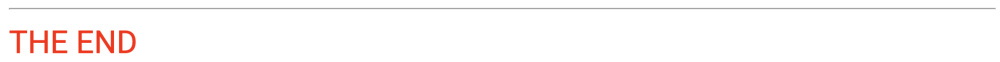